## Fit autocovariance

Objective : Estimate tides paramters by fitting a model to Eulerian and Lagrangian binned covariance of the demodulated velocity field

Several parameters of the fitting method can be testing.
Here we focus on a least-square method.

1) Basic method :

Model : $\tilde V e^{-\tau/\tilde T}cos(\omega\tau)$ ; with $\tilde V$ the variance, $\tilde T$ the incoherence timescale and $\omega = \frac{\omega_{S2}-\omega_{M2}}{2}$ fixed the spring neap cycle frequency over 2 (oscilations caused by demodulation)

No bounds, no first guess for the estimates, same weight at all timelag

2) Bounds imposed

3) More weight on the shortest timelags (20days) and a lot on the first. First guess for $\tilde V$ fixed at the autocovariance at timelag 0

In [1]:
import os
from glob import glob
import threading

import numpy as np
import dask.dataframe as dd
from dask import delayed
import pandas as pd
import xarray as xr
import scipy.optimize
#import mitequinox.sigp as sp

%matplotlib inline
from matplotlib import pyplot as plt
#import matplotlib.animation as anima

from inspect import signature
import scipy

In [2]:
from dask.distributed import Client, LocalCluster
cluster = LocalCluster()
#from dask.distributed import Client
#client = Client()  # set up local cluster on your laptop
client = Client(cluster) # with distributed cluster

distributed.diskutils - INFO - Found stale lock file and directory '/Users/zcaspar/codes/equinox_phd/synthesis_llc4320/dask-worker-space/worker-_x6fao32', purging
distributed.diskutils - INFO - Found stale lock file and directory '/Users/zcaspar/codes/equinox_phd/synthesis_llc4320/dask-worker-space/worker-i64cj1m0', purging
distributed.diskutils - INFO - Found stale lock file and directory '/Users/zcaspar/codes/equinox_phd/synthesis_llc4320/dask-worker-space/worker-9n29csao', purging
distributed.diskutils - INFO - Found stale lock file and directory '/Users/zcaspar/codes/equinox_phd/synthesis_llc4320/dask-worker-space/worker-f52vyi67', purging


In [3]:
def get_tidal_frequencies(*args, units="cpd"):
    """
    """
    from pytide import WaveTable
    td = WaveTable()
    if units=="cpd":
        scale=86400/2/np.pi
    elif units=="cph":
        scale=3600/2/np.pi
    else:
        # cps
        scale=1/2/np.pi
    return {c: td.wave(c).freq * scale for c in args}

tidal_omega = get_tidal_frequencies("M2", "K2","S2","N2")
omega_M2,omega_S2,omega_N2,omega_K2, domega, name = tidal_omega["M2"],tidal_omega["S2"],tidal_omega["N2"],tidal_omega["K2"], .2, "semidiurnal"
omega = (omega_M2+omega_S2)/2

In [4]:
omega_sn = (omega_S2-omega_M2)/2

print('Spring-neap cycle : ', 1/(2*omega_sn), 'days')
print('Oscillation after demodulation ( spring-neap cycle /2): ', 1/omega_sn, 'days')

Spring-neap cycle :  14.765294045749723 days
Oscillation after demodulation ( spring-neap cycle /2):  29.530588091499446 days


In [43]:
def y_fit(tau,T,V):
    return V*np.exp(-tau/T)*np.cos(rad*omega_sn*tau)

def y_fit_low(tau,T,V):
    return V*np.exp(-tau/T)

In [6]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
def plot_maps(ds,colmap='RdBu_r',vlim=(-0.01,0.01),axes=111,**kwargs):
    crs = ccrs.Robinson()
    #fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(axes,projection=crs)
    ds.plot(vmax=vlim[1],vmin=vlim[0],y='lat_bin',ax=ax,
            transform=ccrs.PlateCarree(),cmap=colmap,label=False,**kwargs,
           cbar_kwargs={'fraction':0.02})
    ax.gridlines(draw_labels=True)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.LAND)
    return fig,ax

In [11]:
f = file_E[0]
xr.open_dataset(f).rename({'lon_bins':'lon_bin','lat_bins':'lat_bin','rr':'rr'+f[4:8]}
                                             )

<xarray.Dataset>
Dimensions:  (lon_bin: 179, lat_bin: 59, lags: 321)
Coordinates:
  * lon_bin  (lon_bin) float64 -179.0 -177.0 -175.0 -173.0 ... 173.0 175.0 177.0
  * lat_bin  (lat_bin) float64 -59.0 -57.0 -55.0 -53.0 ... 51.0 53.0 55.0 57.0
  * lags     (lags) float64 0.0 0.125 0.25 0.375 0.5 ... 39.62 39.75 39.88 40.0
Data variables:
    rrrs/z   (lags, lon_bin, lat_bin) float64 ...

In [27]:
#root_path = '/home/datawork-lops-osi/equinox/jetn/'
root_path = '/Users/zcaspar/codes/mit4320/'
#low :
file_E = [root_path +'Ecov_SSU_low_mean0_dl2.nc',root_path +'Ecov_SSV_low_mean0_dl2.nc']
file_L = [root_path +'Lcov_SSU_low_mean0_dl2.nc',root_path +'Lcov_SSV_low_mean0_dl2.nc']

dsE_low = xr.merge([xr.open_dataset(f).rename({'lon_bins':'lon_bin','lat_bins':'lat_bin','rr':'rr'+f[-21:-17]}
                                             ) for f in file_E])
dsL_low = xr.merge([xr.open_dataset(f).rename({'lon_bins':'lon_bin','lat_bins':'lat_bin','rr':'rr'+f[-21:-17]}
                                             ) for f in file_L])


ds_low_dl1 = xr.merge([xr.open_dataset(root_path+'energy_SSU_low_binned_dl1.0.nc'),
                   xr.open_dataset(root_path+'energy_SSV_low_binned_dl1.0.nc')])

ds_low_dl2 = xr.merge([xr.open_dataset(root_path+'energy_SSU_low_binned_dl2.0.nc'),
                   xr.open_dataset(root_path+'energy_SSV_low_binned_dl2.0.nc')])

In [28]:
dsL_low

<xarray.Dataset>
Dimensions:  (lat_bin: 59, lon_bin: 179, lags: 961)
Coordinates:
  * lat_bin  (lat_bin) float64 -59.0 -57.0 -55.0 -53.0 ... 51.0 53.0 55.0 57.0
  * lon_bin  (lon_bin) float64 -179.0 -177.0 -175.0 -173.0 ... 173.0 175.0 177.0
  * lags     (lags) float64 0.0 0.04167 0.08333 0.125 ... 39.88 39.92 39.96 40.0
Data variables:
    rr_SSU   (lat_bin, lon_bin, lags) float64 ...
    count    (lat_bin, lon_bin) float64 0.0 1.0 0.0 0.0 ... 9.0 14.0 11.0 14.0
    rr_SSV   (lat_bin, lon_bin, lags) float64 ...

### Visualization energy

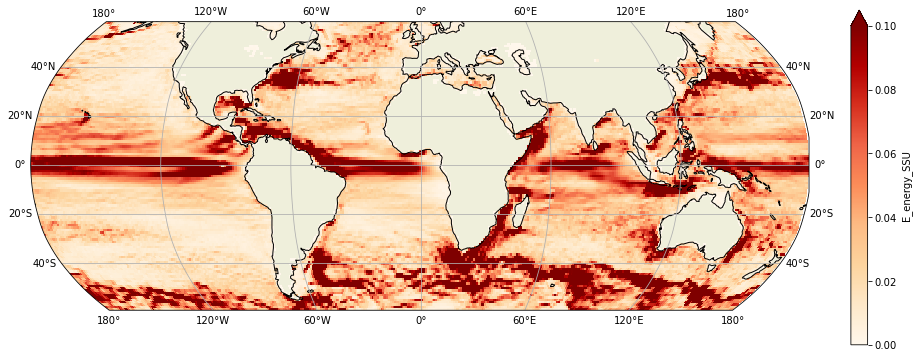

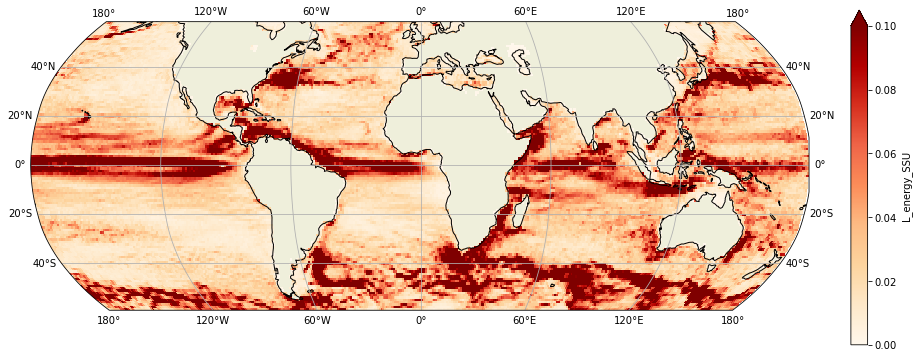

In [29]:
cmap = 'OrRd'
figsize=(15,15)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(ds_low_dl1.E_energy_SSU,vlim=(0,0.1),colmap=cmap)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(ds_low_dl1.L_energy_SSU,vlim=(0,0.1),colmap=cmap)

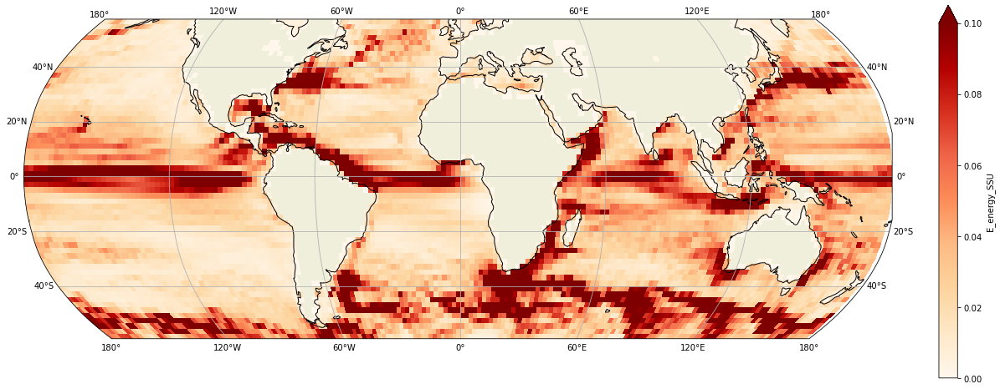

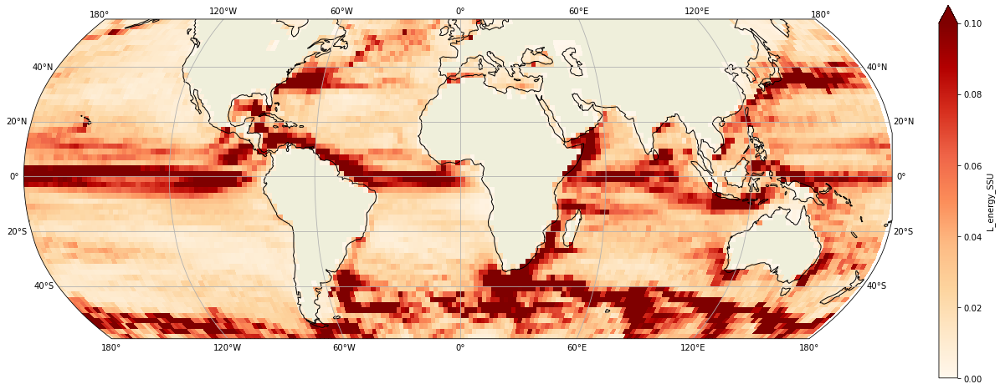

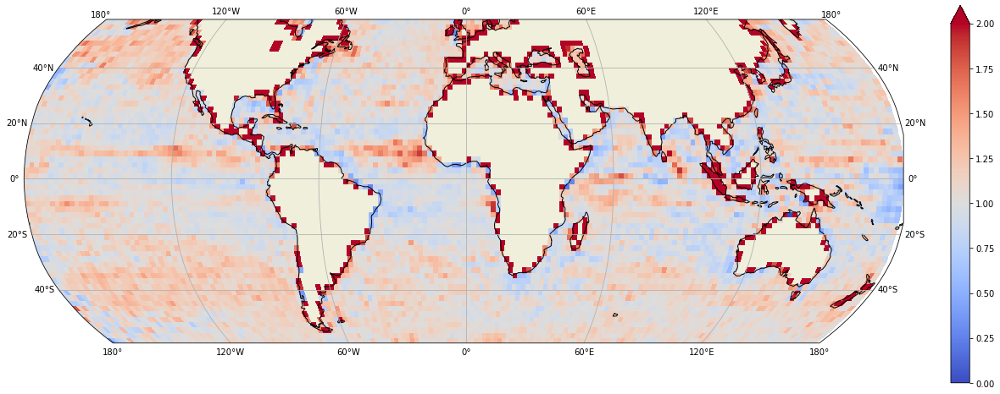

In [45]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(ds_low_dl2.E_energy_SSU,vlim=(0,0.1),colmap=cmap)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(ds_low_dl2.L_energy_SSU,vlim=(0,0.1),colmap=cmap)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(ds_low_dl2.L_energy_SSU/ds_low_dl2.E_energy_SSU,vlim=(0,2),colmap='coolwarm')

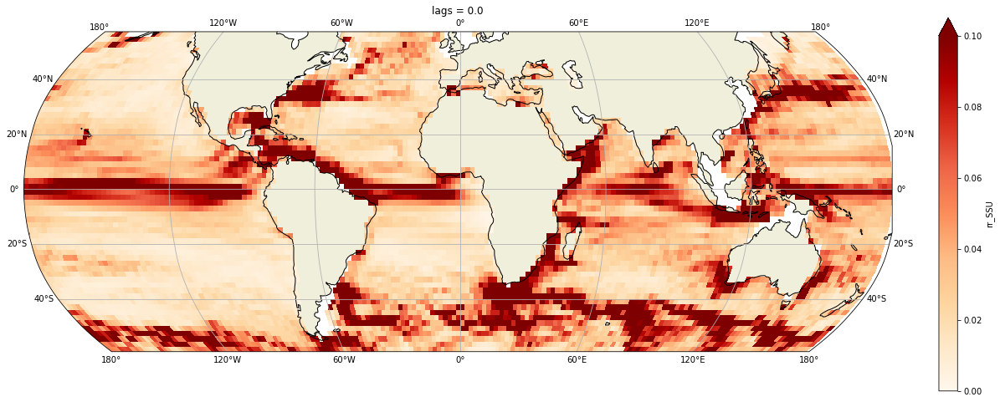

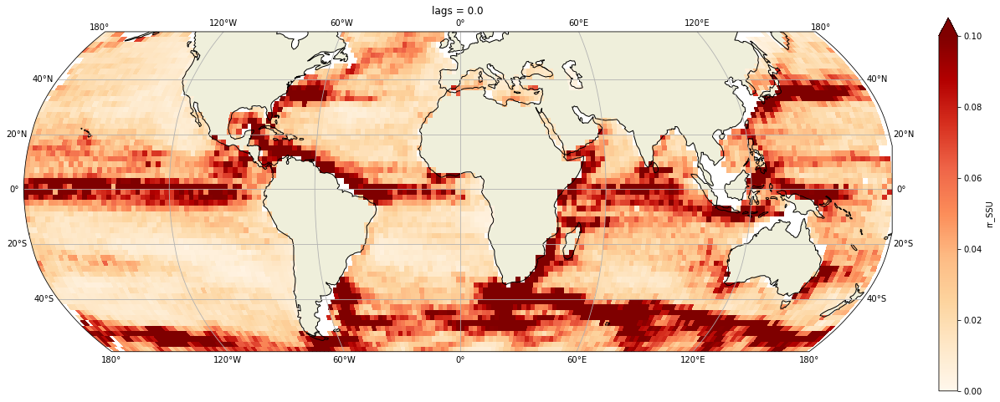

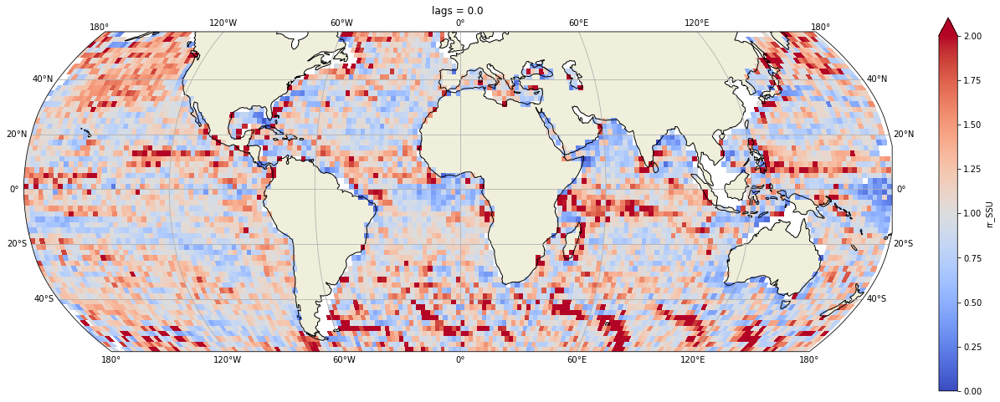

In [46]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsE_low.rr_SSU.isel(lags=0),vlim=(0,0.1),colmap=cmap)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low.rr_SSU.isel(lags=0),vlim=(0,0.1),colmap=cmap)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps((dsL_low.rr_SSU/dsE_low.rr_SSU).isel(lags=0),vlim=(0,2),colmap='coolwarm')

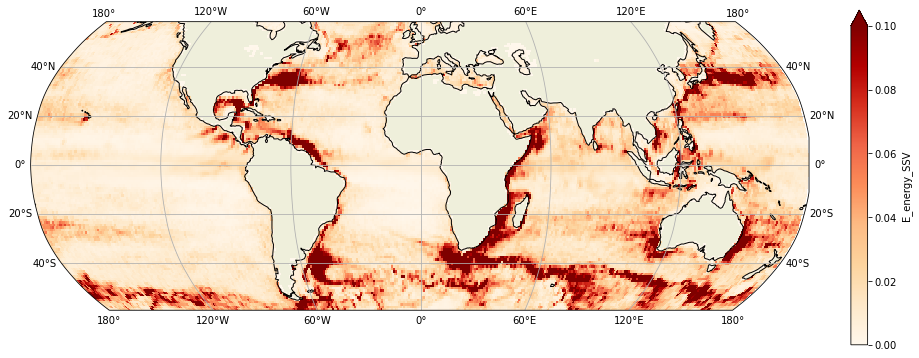

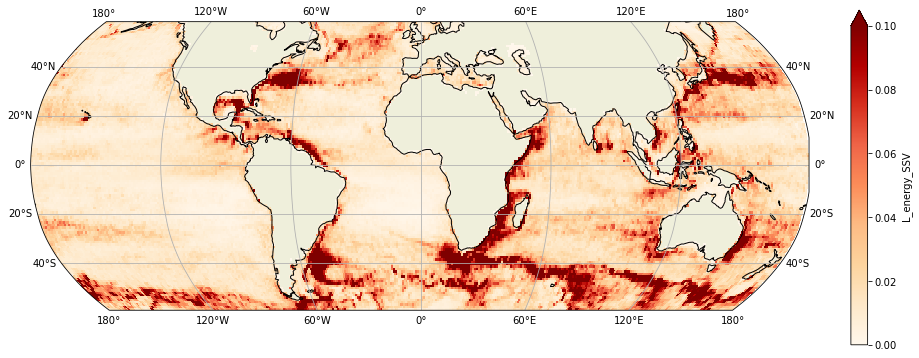

In [64]:
cmap = 'OrRd'
figsize=(15,15)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(ds_low_dl1.E_energy_SSV,vlim=(0,0.1),colmap=cmap)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(ds_low_dl1.L_energy_SSV,vlim=(0,0.1),colmap=cmap)

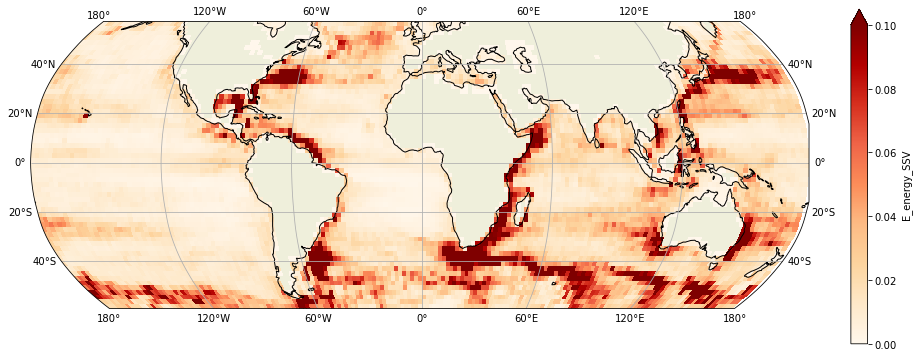

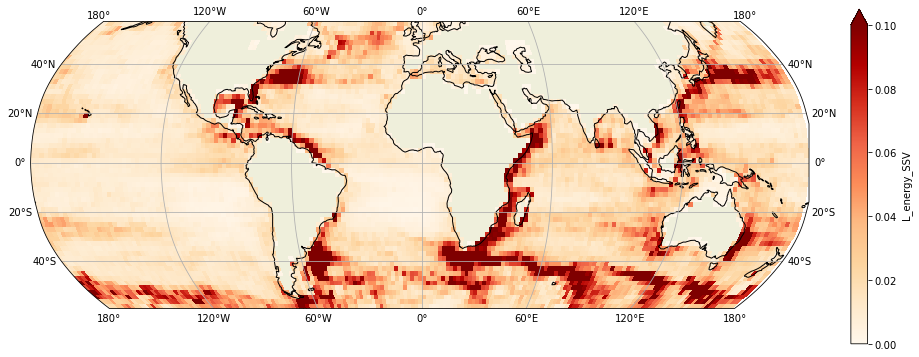

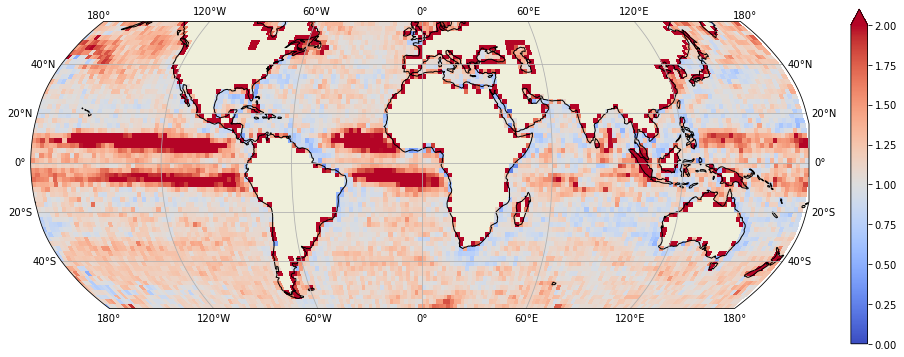

In [65]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(ds_low_dl2.E_energy_SSV,vlim=(0,0.1),colmap=cmap)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(ds_low_dl2.L_energy_SSV,vlim=(0,0.1),colmap=cmap)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(ds_low_dl2.L_energy_SSV/ds_low_dl2.E_energy_SSV,vlim=(0,2),colmap='coolwarm')

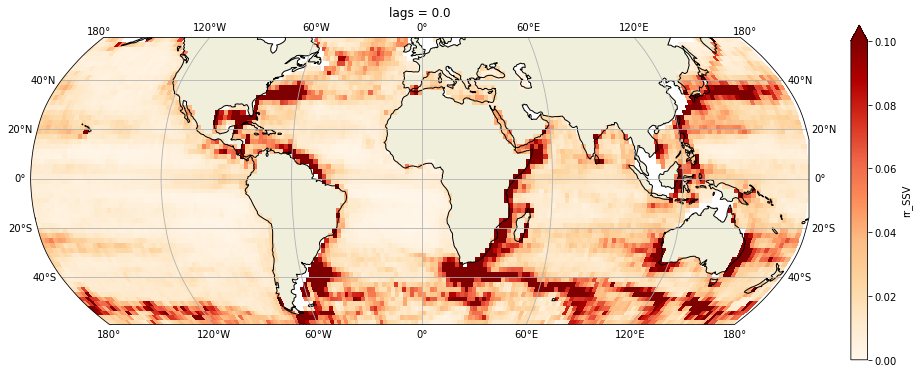

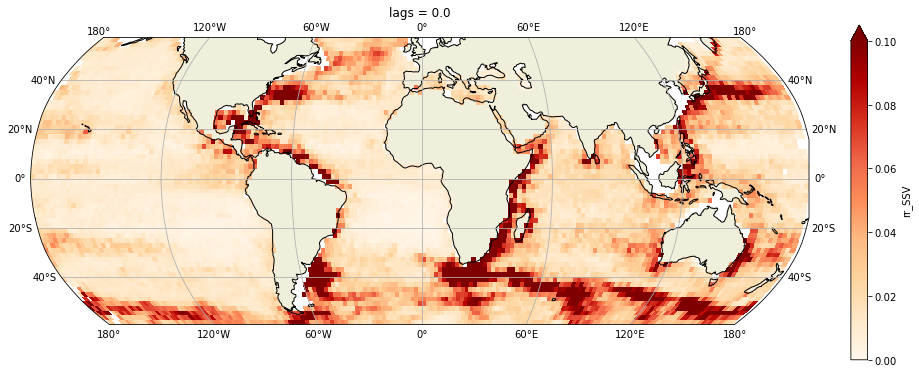

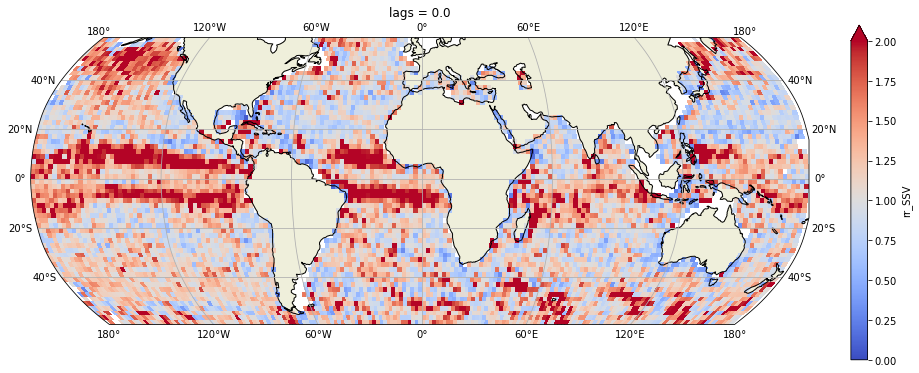

In [66]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsE_low.rr_SSV.isel(lags=0),vlim=(0,0.1),colmap=cmap)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low.rr_SSV.isel(lags=0),vlim=(0,0.1),colmap=cmap)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps((dsL_low.rr_SSV/dsE_low.rr_SSV).isel(lags=0),vlim=(0,2),colmap='coolwarm')

### Visualization autocovariance

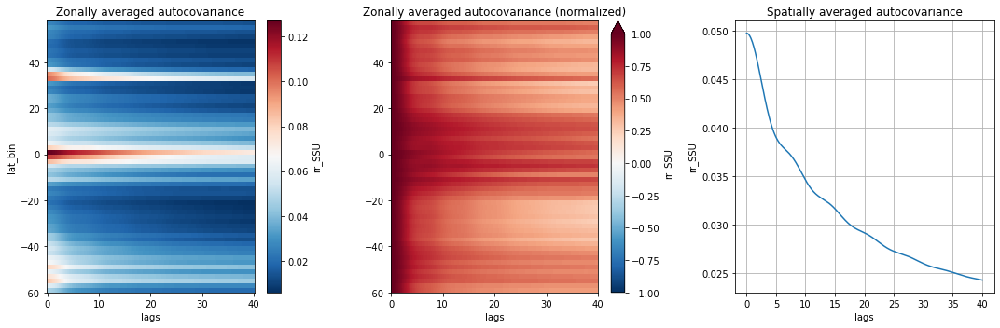

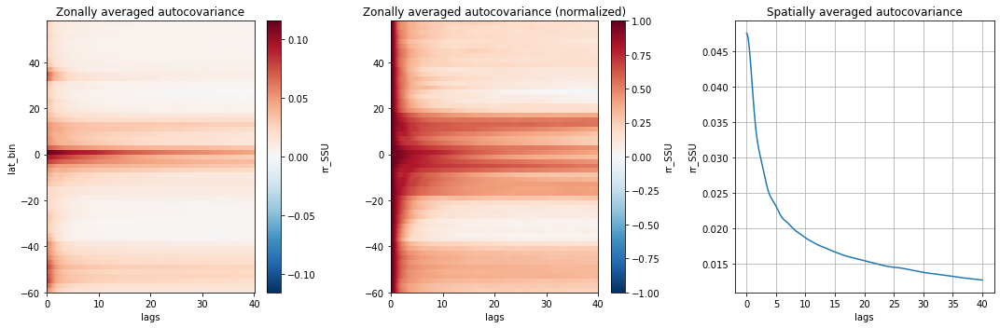

In [32]:
fig,axs = plt.subplots(1,3,figsize=(15,5))
dsE_low.rr_SSU.mean('lon_bin').plot(cmap='RdBu_r',ax=axs[0],y='lat_bin');axs[0].set_title('Zonally averaged autocovariance')
(dsE_low.rr_SSU.mean('lon_bin')/dsE_low.rr_SSU.mean('lon_bin').isel(lags=0)).plot(cmap='RdBu_r',ax=axs[1],y='lat_bin',vmax=1,vmin=-1);
axs[1].set_title('Zonally averaged autocovariance (normalized)')
dsE_low.rr_SSU.mean(['lon_bin','lat_bin']).plot(ax=axs[2]);
#dsL_80.rr.mean(['lon_bins','lat_bins']).plot(ax=axs[2],xlim=(0,40));
axs[2].set_title('Spatially averaged autocovariance')
axs[1].set_ylabel('')
axs[2].grid();
fig.tight_layout()

fig,axs = plt.subplots(1,3,figsize=(15,5))
dsL_low.rr_SSU.mean('lon_bin').plot(ax=axs[0]);axs[0].set_title('Zonally averaged autocovariance')
(dsL_low.rr_SSU.mean('lon_bin')/dsL_low.rr_SSU.mean('lon_bin').isel(lags=0)).plot(ax=axs[1]);
axs[1].set_title('Zonally averaged autocovariance (normalized)')
dsL_low.rr_SSU.mean(['lon_bin','lat_bin']).plot(ax=axs[2]);
axs[2].set_title('Spatially averaged autocovariance')
axs[1].set_ylabel('')
axs[2].grid();
fig.tight_layout()

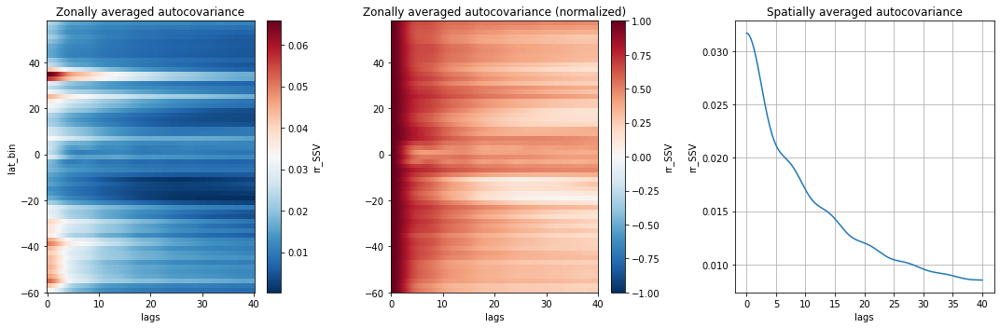

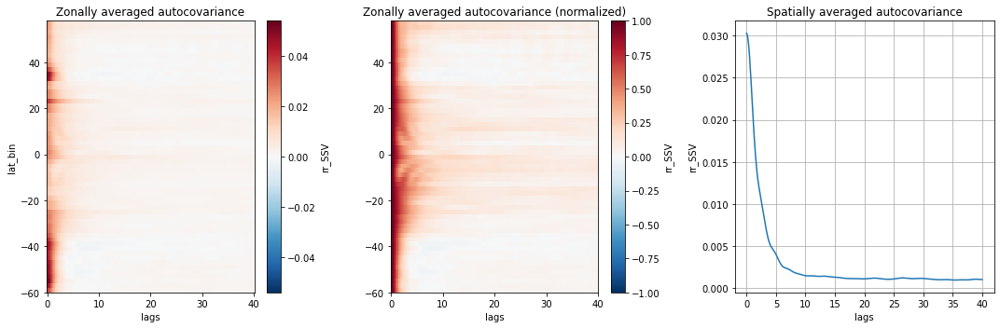

In [68]:
fig,axs = plt.subplots(1,3,figsize=(15,5))
dsE_low.rr_SSV.mean('lon_bin').plot(cmap='RdBu_r',ax=axs[0],y='lat_bin');axs[0].set_title('Zonally averaged autocovariance')
(dsE_low.rr_SSV.mean('lon_bin')/dsE_low.rr_SSV.mean('lon_bin').isel(lags=0)).plot(cmap='RdBu_r',ax=axs[1],y='lat_bin',vmax=1,vmin=-1);
axs[1].set_title('Zonally averaged autocovariance (normalized)')
dsE_low.rr_SSV.mean(['lon_bin','lat_bin']).plot(ax=axs[2]);
#dsL_80.rr.mean(['lon_bins','lat_bins']).plot(ax=axs[2],xlim=(0,40));
axs[2].set_title('Spatially averaged autocovariance')
axs[1].set_ylabel('')
axs[2].grid();
fig.tight_layout()

fig,axs = plt.subplots(1,3,figsize=(15,5))
dsL_low.rr_SSV.mean('lon_bin').plot(ax=axs[0]);axs[0].set_title('Zonally averaged autocovariance')
(dsL_low.rr_SSV.mean('lon_bin')/dsL_low.rr_SSV.mean('lon_bin').isel(lags=0)).plot(ax=axs[1]);
axs[1].set_title('Zonally averaged autocovariance (normalized)')
dsL_low.rr_SSV.mean(['lon_bin','lat_bin']).plot(ax=axs[2]);
axs[2].set_title('Spatially averaged autocovariance')
axs[1].set_ylabel('')
axs[2].grid();
fig.tight_layout()

### Estimation of paraeters : fit 

In [33]:
dt = 3/24 # time step in days
rad = 2*np.pi
tau = np.arange(0,dsL_low.lags.max()+dt,dt) #time lag

In [34]:
def fit_function(y,t=None,myfunc=None,first_guess='free',bounds=None,sigma=None):
    """Compute the best fit parameters found using scipy.optimize.curve_fit
        Parameters
        ----------
        y : data to fit
        t : timelag of the correlation function
        myfunc : function we want to fit to our data, y
        p0 : first guess on parameters
        bounds : bounds of the parameters to fit 
        
        Returns
        ----------
        params : parameters for which we obtain the best fit
        error : covariance of params computed in scipy.optimize.curve_fit
        yfit : best fit
        """
    sig = signature(myfunc)
    len_sig = len(sig.parameters.keys())
    try : 
        if first_guess=='lag' and sigma is None:
            _p0 = np.full(len_sig-1,1)
            _p0[-1] = y[0]
            params,cov = scipy.optimize.curve_fit(myfunc,t,y,p0=_p0,bounds=bounds,maxfev=1000)
    #    try:
        if sigma is not None:
            if first_guess=='lag':
                _p0 = np.full(len_sig-1,1)
                _p0[-1] = y[0]
                params,cov = scipy.optimize.curve_fit(myfunc,t,y,p0=_p0,bounds=bounds,maxfev=1000,
                                                  sigma=sigma,absolute_sigma=True)
            else:
                params,cov = scipy.optimize.curve_fit(myfunc,t,y,bounds=bounds,maxfev=1000,
                                                  sigma=sigma,absolute_sigma=True)
        else:
            params,cov = scipy.optimize.curve_fit(myfunc,t,y,bounds=bounds,maxfev=1000)
        yfit = myfunc(t,*[p for p in params])
        error=np.sqrt(np.diag(cov))
    except:
        params,error = np.full(len_sig-1,np.nan),np.full(len_sig-1,np.nan)
        yfit = np.full_like(t,np.nan)
#        out = xr.Dataset({'params':(['lat_bins','lon_bins','param'],np.expand_dims(params, axis=0)),
#                      'fitted':(['lat_bins','lon_bins','lags'],np.expand_dims(yfit,axis=0)),
#                     'error' : (['lat_bins','lon_bins','param'],np.expand_dims(cov,axis=0))},
 #                    coords={'lat_bins':np.array([y.lat_bins.values]),'lon_bins':np.array([y.lon_bins.values])
 #                            ,'param':[V for V in sig.parameters.keys()][1:],
 #                            'lags':y.lags.values})
    return params,error,yfit
def wrapper(ds,v,myfunc,t,bounds,p0='free',sigma=None):
    sig = signature(myfunc)
    params_name = [V for V in sig.parameters.keys()][1:]
    kwargs={'t':t,'myfunc':myfunc,'first_guess':p0,'bounds':bounds}
    if sigma is not None:
        kwargs.update({'sigma':sigma})
        
    print('Parameters to estimate:',params_name)
    params,error,yfit = xr.apply_ufunc(fit_function,ds[v],input_core_dims=[['lags']],
                                   output_core_dims=[['param'],['param'],['lags']],
                                   vectorize=True,kwargs=kwargs)
    params = params.rename('parameters').assign_coords({'param':params_name})
    error = error.rename('error').assign_coords({'param':params_name})
    ds_out = xr.merge([params,error,yfit])
#    ds_out = ds_out.where(ds_out[v].isel(lags=0)>1e-18)
    return ds_out

In [35]:
dsE_low = dsE_low.where(dsE_low.rr_SSU.isel(lags=0)>0)

In [36]:
dsL_low = dsL_low.isel(lags=slice(0,None,3))

In [37]:
sigma = np.ones(tau.size)
sigma[:int(20/dt)] = 0.1

In [44]:
dsE_low_out = wrapper(dsE_low,'rr_SSU',y_fit_low,tau,sigma=sigma,bounds=([0,0],[np.inf,np.inf]))
dsL_low_out = wrapper(dsL_low,'rr_SSU',y_fit_low,tau,sigma=sigma,bounds=([0,0],[np.inf,np.inf]))

Parameters to estimate: ['T', 'V']
Parameters to estimate: ['T', 'V']


In [47]:
_dsE_low_out = wrapper(dsE_low,'rr_SSV',y_fit_low,tau,sigma=sigma,bounds=([0,0],[np.inf,np.inf]))
_dsL_low_out = wrapper(dsL_low,'rr_SSV',y_fit_low,tau,sigma=sigma,bounds=([0,0],[np.inf,np.inf]))

Parameters to estimate: ['T', 'V']
Parameters to estimate: ['T', 'V']


In [70]:
dsE_low_out = xr.merge([dsE_low_out,_dsE_low_out.rr_SSV])
dsE_low_out

<xarray.Dataset>
Dimensions:      (lon_bin: 179, lat_bin: 59, param: 2, lags: 321)
Coordinates:
  * lon_bin      (lon_bin) float64 -179.0 -177.0 -175.0 ... 173.0 175.0 177.0
  * lat_bin      (lat_bin) float64 -59.0 -57.0 -55.0 -53.0 ... 53.0 55.0 57.0
  * param        (param) <U1 'T' 'V'
  * lags         (lags) float64 0.0 0.125 0.25 0.375 ... 39.62 39.75 39.88 40.0
Data variables:
    parameters   (lon_bin, lat_bin, param) float64 55.67 0.0536 ... 0.006979
    error        (lon_bin, lat_bin, param) float64 91.91 0.01687 ... 0.02051
    rr_SSU       (lon_bin, lat_bin, lags) float64 0.0536 0.05348 ... 0.000581
    rr_SSU_norm  (lon_bin, lat_bin, lags) float64 1.0 0.9978 ... 0.0839 0.08325
    rr_SSV       (lon_bin, lat_bin, lags) float64 0.01627 0.01615 ... 0.0004068

In [71]:
dsL_low_out = xr.merge([dsL_low_out,_dsL_low_out.rr_SSV])

#### Variance

Text(0.5, 1.0, 'Estimated Lagrangian variance (2°x2° bins)')

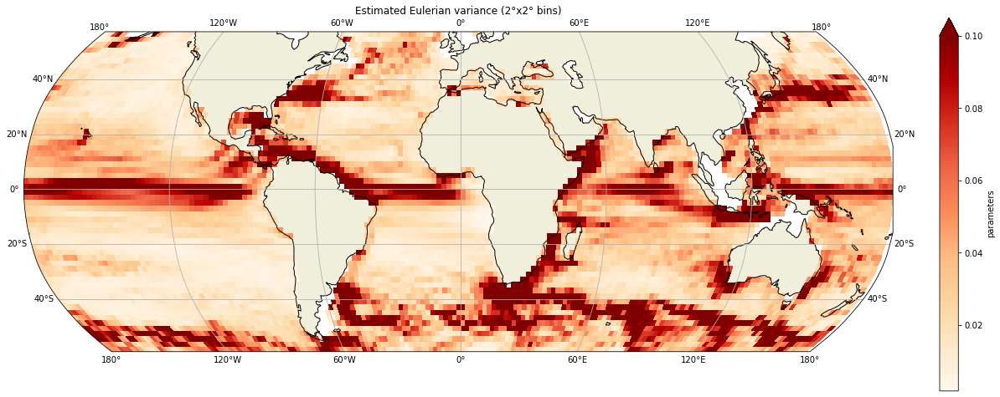

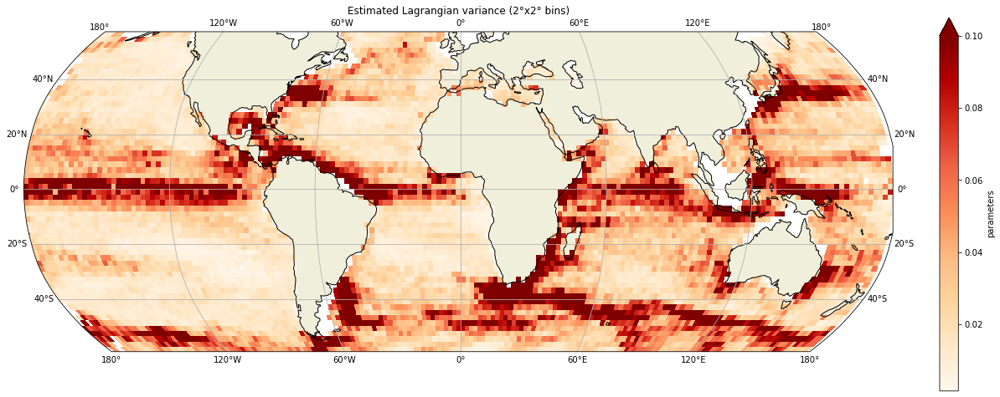

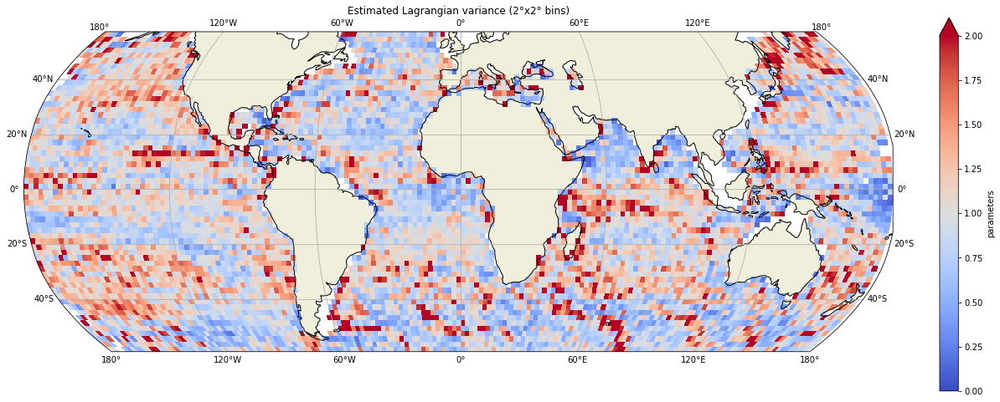

In [49]:
figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsE_low_out.sel(param = 'V').parameters,colmap=cmap,vlim=(None,0.1))
ax.set_title('Estimated Eulerian variance (2°x2° bins)')

figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low_out.sel(param = 'V').parameters,colmap=cmap,vlim=(None,0.1))
ax.set_title('Estimated Lagrangian variance (2°x2° bins)')

figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low_out.sel(param = 'V').parameters/dsE_low_out.sel(param = 'V').parameters,
                   colmap='coolwarm',vlim=(0,2))
ax.set_title('Estimated Lagrangian variance (2°x2° bins)')

#### Notes

Lagrangian energy exhibits a lot of noise. This is due to the mean position used for the autocovariance. The drifters travel a lot more than 2° in a time period of 40 days in energetic areas.

Text(0.5, 1.0, 'Estimated Lagrangian variance (2°x2° bins)')

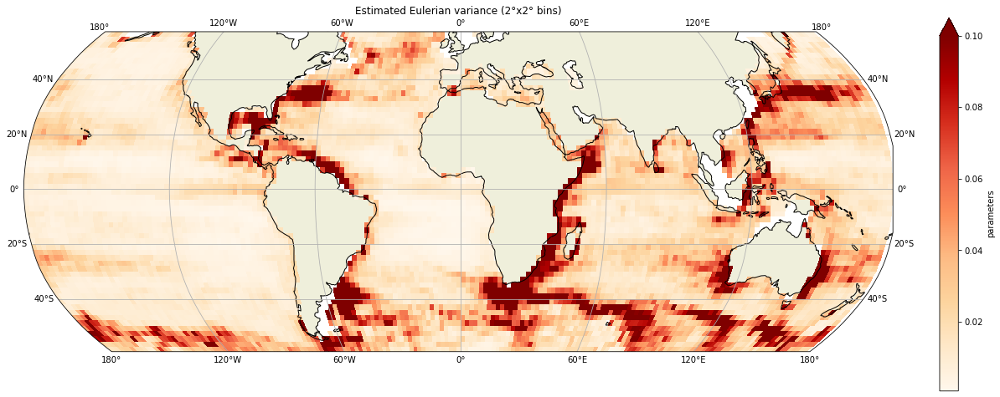

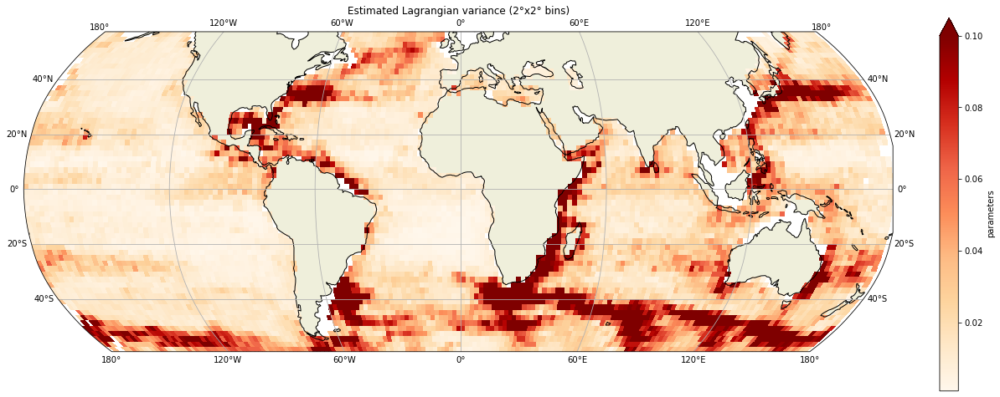

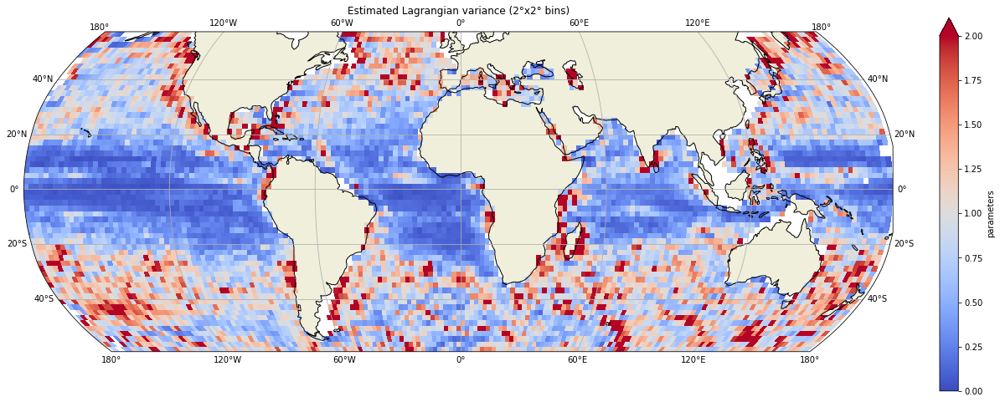

In [50]:
figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsE_low_out.sel(param = 'V').parameters,colmap=cmap,vlim=(None,0.1))
ax.set_title('Estimated Eulerian variance (2°x2° bins)')

figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsL_low_out.sel(param = 'V').parameters,colmap=cmap,vlim=(None,0.1))
ax.set_title('Estimated Lagrangian variance (2°x2° bins)')

figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsL_low_out.sel(param = 'V').parameters/dsE_low_out.sel(param = 'V').parameters,
                   colmap='coolwarm',vlim=(0,2))
ax.set_title('Estimated Lagrangian variance (2°x2° bins)')

#### Decorrelation timescale

Text(0.5, 1.0, 'Estimated Lagrangian decorrelation timescale (2°x2° bins)')

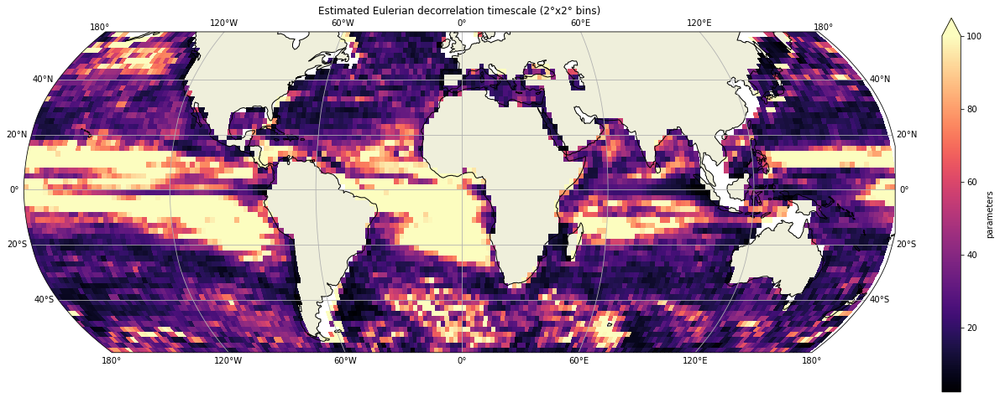

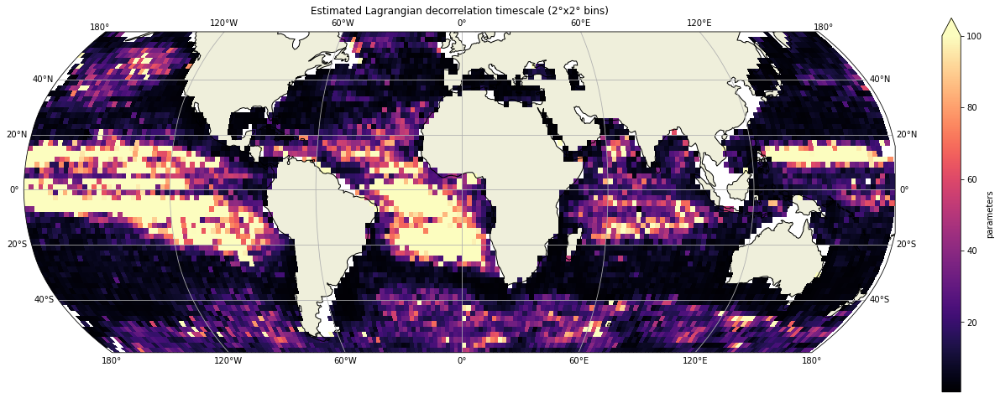

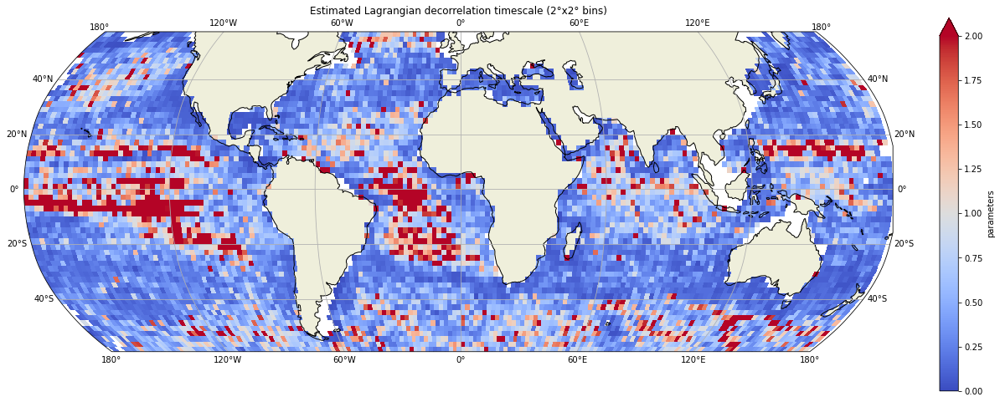

In [51]:
figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsE_low_out.sel(param = 'T').parameters,colmap='magma',vlim=(None,100))
ax.set_title('Estimated Eulerian decorrelation timescale (2°x2° bins)')

figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low_out.sel(param = 'T').parameters,colmap='magma',vlim=(None,100))
ax.set_title('Estimated Lagrangian decorrelation timescale (2°x2° bins)')

figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low_out.sel(param = 'T').parameters/dsE_low_out.sel(param = 'T').parameters,
                   colmap='coolwarm',vlim=(0,2))
ax.set_title('Estimated Lagrangian decorrelation timescale (2°x2° bins)')

Text(0.5, 1.0, 'Estimated Lagrangian decorrelation timescale (2°x2° bins)')

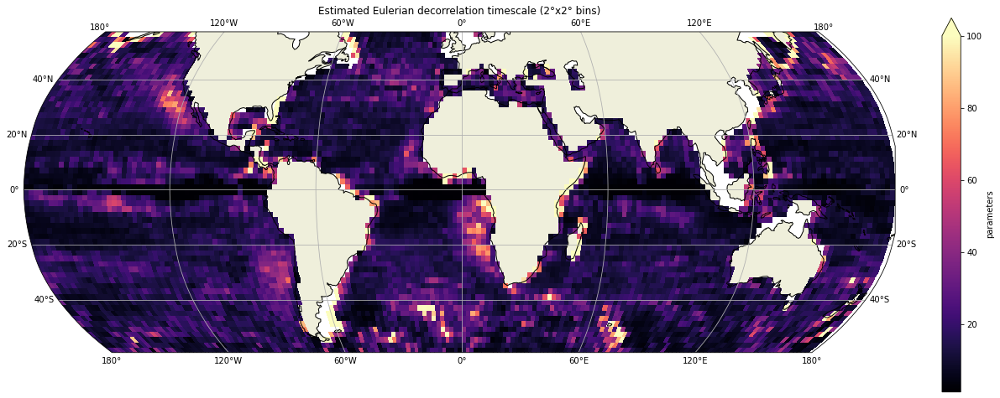

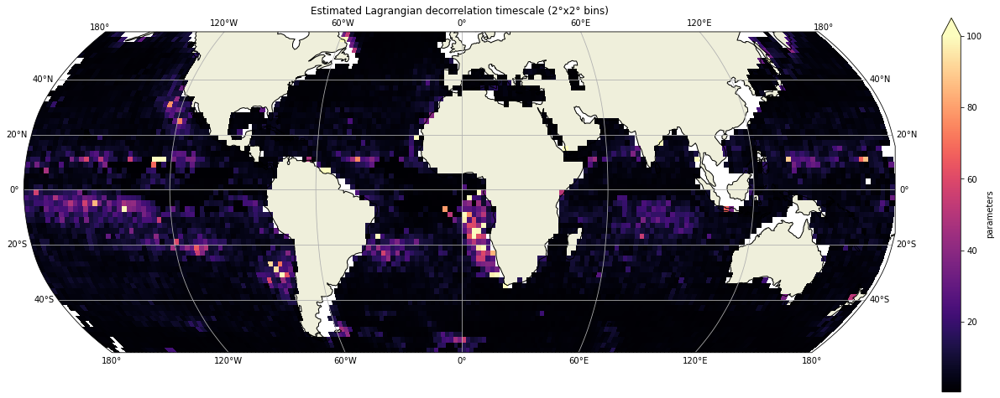

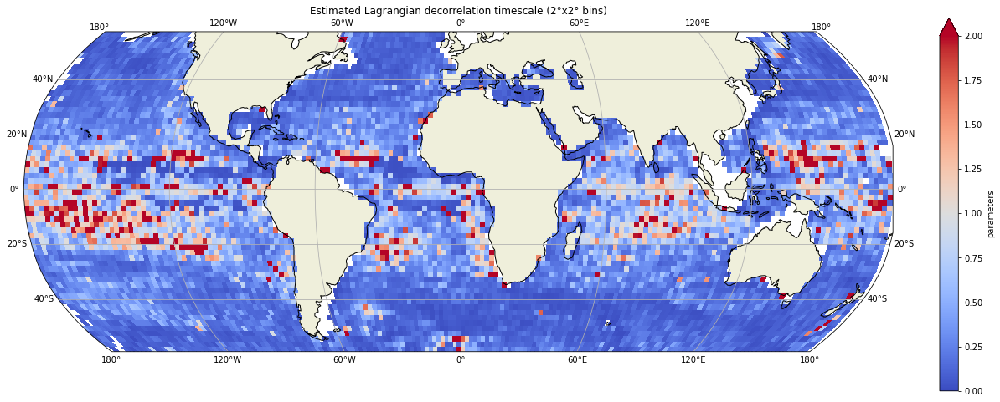

In [52]:
figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsE_low_out.sel(param = 'T').parameters,colmap='magma',vlim=(None,100))
ax.set_title('Estimated Eulerian decorrelation timescale (2°x2° bins)')

figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsL_low_out.sel(param = 'T').parameters,colmap='magma',vlim=(None,100))
ax.set_title('Estimated Lagrangian decorrelation timescale (2°x2° bins)')

figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsL_low_out.sel(param = 'T').parameters/_dsE_low_out.sel(param = 'T').parameters,
                   colmap='coolwarm',vlim=(0,2))
ax.set_title('Estimated Lagrangian decorrelation timescale (2°x2° bins)')

In [72]:
for V in ['rr_SSU','rr_SSV']:
    dsE_low[V+'_norm'] = dsE_low[V]/dsE_low[V].isel(lags=0)
    dsL_low[V+'_norm'] = dsL_low[V]/dsL_low[V].isel(lags=0)
    dsE_low_out[V+'_norm'] = dsE_low_out[V]/dsE_low_out[V].isel(lags=0)
    dsL_low_out[V+'_norm'] = dsL_low_out[V]/dsL_low_out[V].isel(lags=0)

In [73]:
#2 points in different areas : short E and L timescales, large E and L timescales, L << E, L>E
areas = {'South atlantic ridge' : [[-15,-5],[-15,-15],[-15,-25]],
        'Gulf stream' : [[-70,35],[-60,35]],
        'South Indian ocean' : [[58,-44],[78,-44]],
        'Pacific (equator)' : [[-100,-5],[-100,5],[-100,10]]
        }

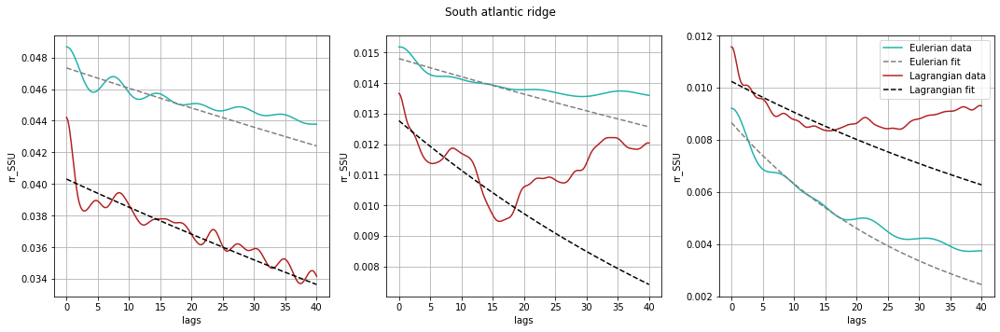

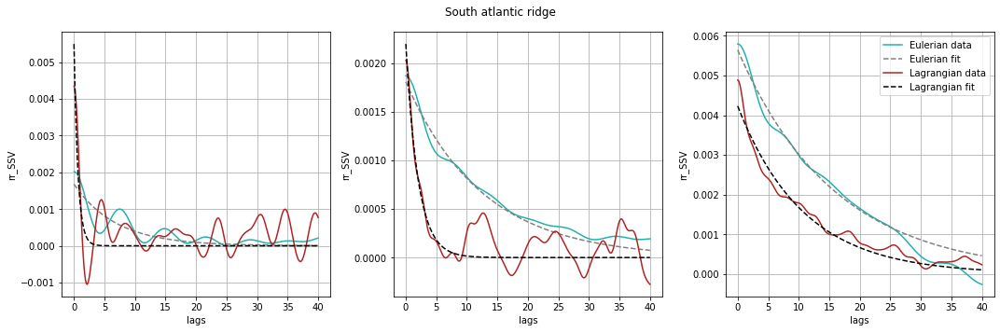

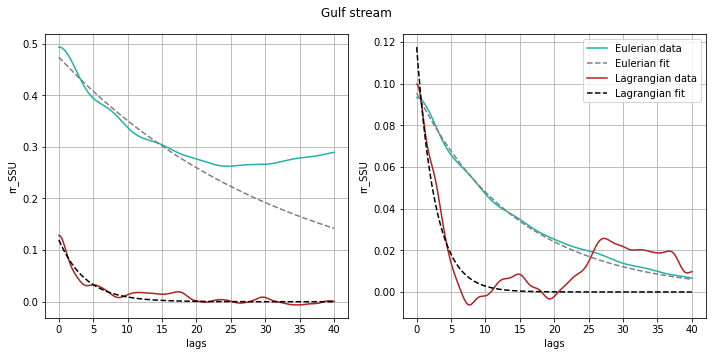

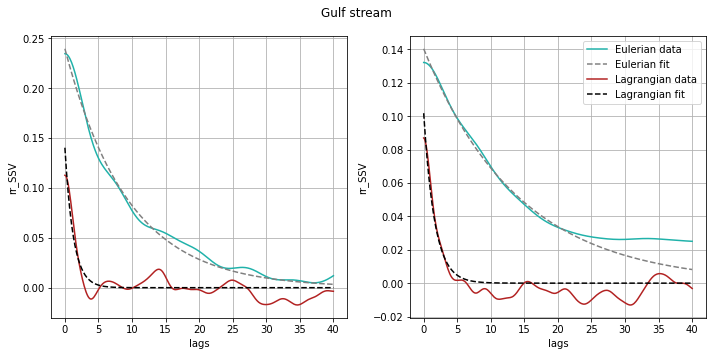

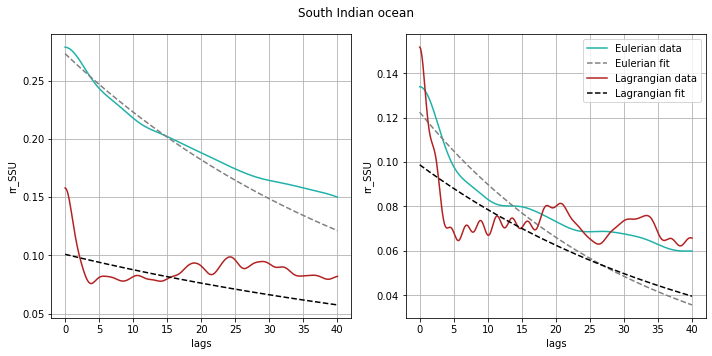

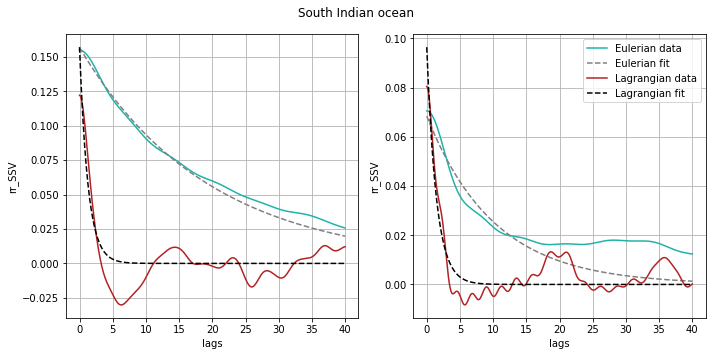

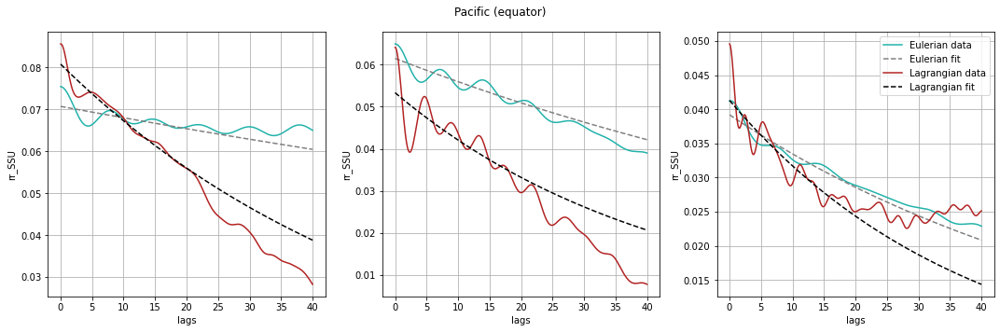

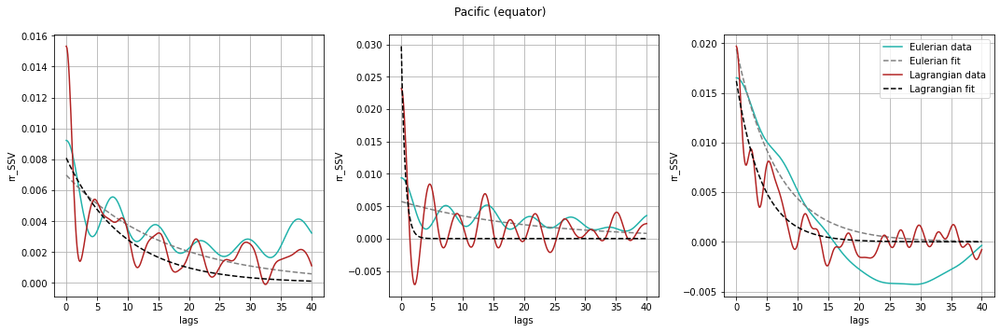

In [74]:
for k in areas.keys():
    for V in ['rr_SSU','rr_SSV']:
        fig,axs = plt.subplots(1,len(areas[k]),figsize=(5*len(areas[k]),5),sharey=False)
        for ax,pt in zip(axs,areas[k]):
            dsE_low[V].sel(lat_bin=pt[1],lon_bin=pt[0],method='nearest'
                              ).plot(ax=ax,c='lightseagreen',label='Eulerian data');
            dsE_low_out[V].sel(lat_bin=pt[1],lon_bin=pt[0],method='nearest'
                                  ).plot(ax=ax,c='grey',linestyle='--',label='Eulerian fit');
            dsL_low[V].sel(lat_bin=pt[1],lon_bin=pt[0],method='nearest'
                          ).plot(ax=ax,c='firebrick',label='Lagrangian data');
            dsL_low_out[V].sel(lat_bin=pt[1],lon_bin=pt[0],method='nearest'
                              ).plot(ax=ax,c='k',linestyle='--',label='Lagrangian fit');
            ax.grid();ax.set_title('');
    #        low_var = dsE_low.rr.sel(lat_bin=pt[1],lon_bin=pt[0],method='nearest').isel(lags=0).values
    #        ax.text(0,-0.004,r'$\overline{V}^2 \sim%s$'%np.around(low_var,decimals=4))
        ax.legend()
        fig.suptitle(k);fig.tight_layout();

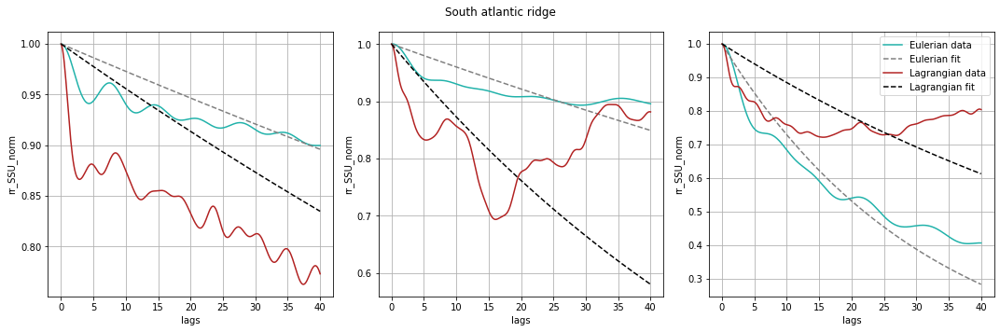

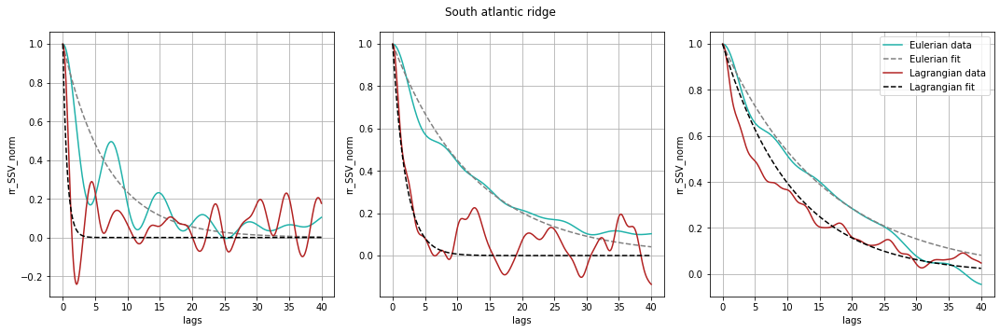

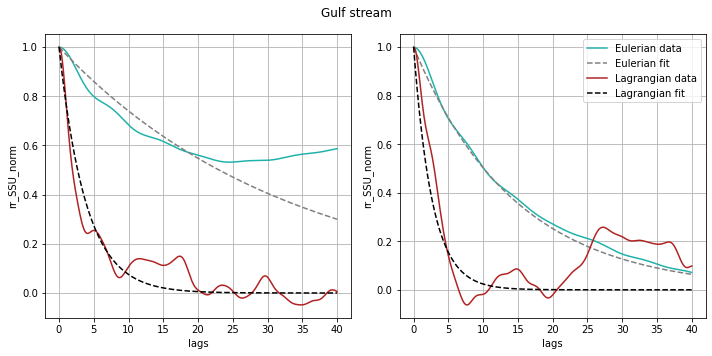

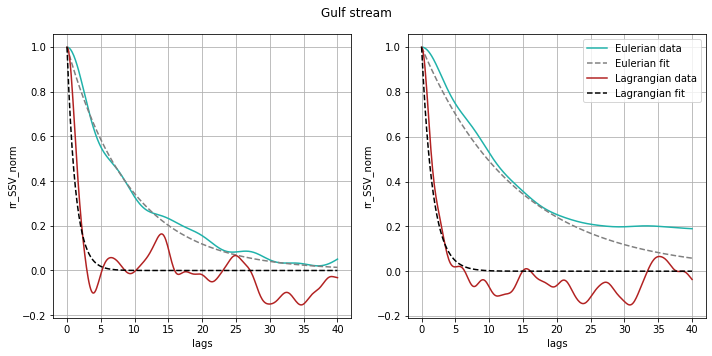

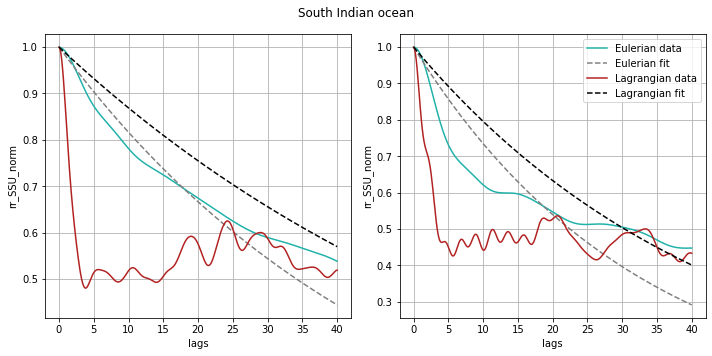

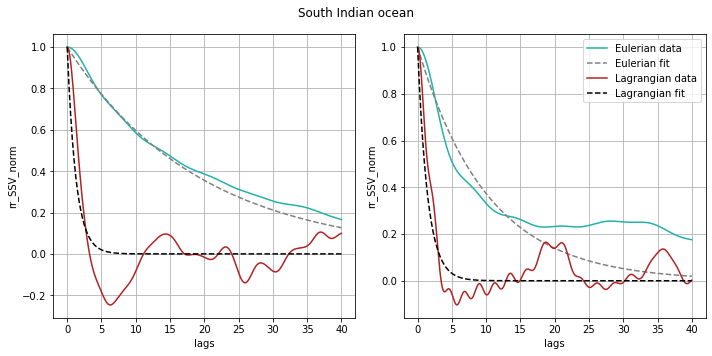

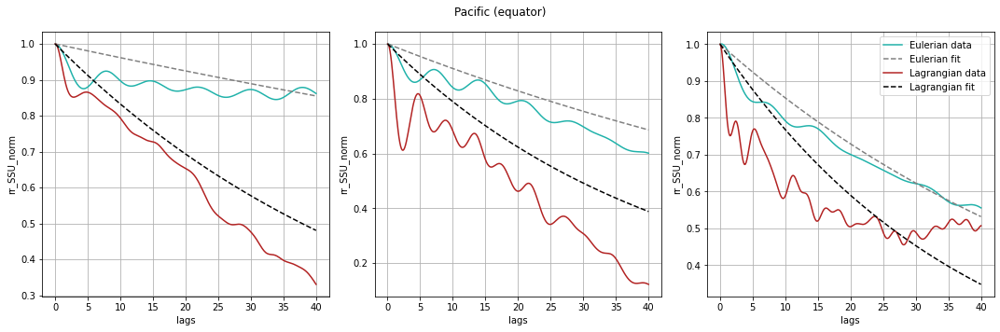

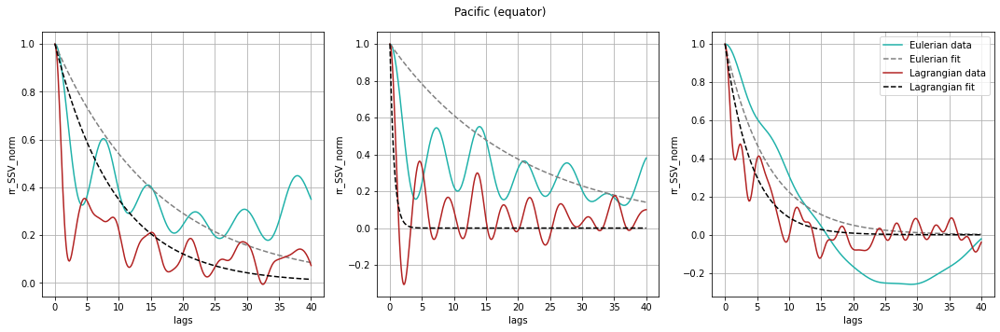

In [75]:
for k in areas.keys():
    for V in ['rr_SSU','rr_SSV']:
        fig,axs = plt.subplots(1,len(areas[k]),figsize=(5*len(areas[k]),5),sharey=False)
        for ax,pt in zip(axs,areas[k]):
            dsE_low[V+'_norm'].sel(lat_bin=pt[1],lon_bin=pt[0],method='nearest'
                                   ).plot(ax=ax,c='lightseagreen',label='Eulerian data');
            dsE_low_out[V+'_norm'].sel(lat_bin=pt[1],lon_bin=pt[0],method='nearest'
                                      ).plot(ax=ax,c='grey',linestyle='--',label='Eulerian fit');
            dsL_low[V+'_norm'].sel(lat_bin=pt[1],lon_bin=pt[0],method='nearest'
                                  ).plot(ax=ax,c='firebrick',label='Lagrangian data');
            dsL_low_out[V+'_norm'].sel(lat_bin=pt[1],lon_bin=pt[0],method='nearest'
                                      ).plot(ax=ax,c='k',linestyle='--',label='Lagrangian fit');
            ax.grid();ax.set_title('');
    #        low_var = dsE_low.rr.sel(lat_bin=pt[1],lon_bin=pt[0],method='nearest').isel(lags=0).values
    #        ax.text(0,-0.004,r'$\overline{V}^2 \sim%s$'%np.around(low_var,decimals=4))
        ax.legend()
        fig.suptitle(k);fig.tight_layout();

In [77]:
Te_integrate = xr.merge([2*(dsE_low[V]).integrate('lags')/dsE_low[V].isel(lags=0) for V in ['rr_SSU','rr_SSV']])
Tl_integrate = xr.merge([(2*(dsL_low[V]).integrate('lags')/dsL_low[V].isel(lags=0)) for V in ['rr_SSU','rr_SSV']])
#.plot(y='lat_bin',vmax=10)

In [78]:
Te_integrate

<xarray.Dataset>
Dimensions:  (lon_bin: 179, lat_bin: 59)
Coordinates:
  * lon_bin  (lon_bin) float64 -179.0 -177.0 -175.0 -173.0 ... 173.0 175.0 177.0
  * lat_bin  (lat_bin) float64 -59.0 -57.0 -55.0 -53.0 ... 51.0 53.0 55.0 57.0
    lags     float64 0.0
Data variables:
    rr_SSU   (lon_bin, lat_bin) float64 57.87 45.65 40.52 ... 57.65 33.37 25.9
    rr_SSV   (lon_bin, lat_bin) float64 35.18 16.62 29.95 ... 42.58 20.74 25.29

Text(0.5, 1.0, 'Estimated Eulerian decorrelation timescale (2°x2° bins)')

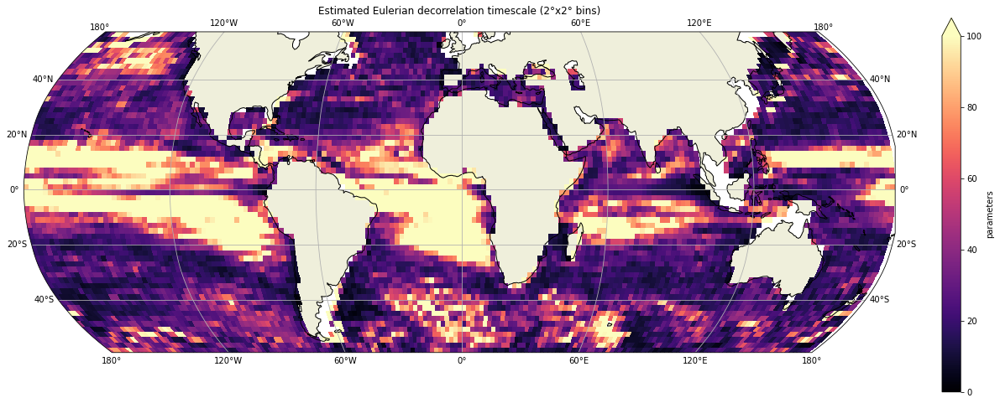

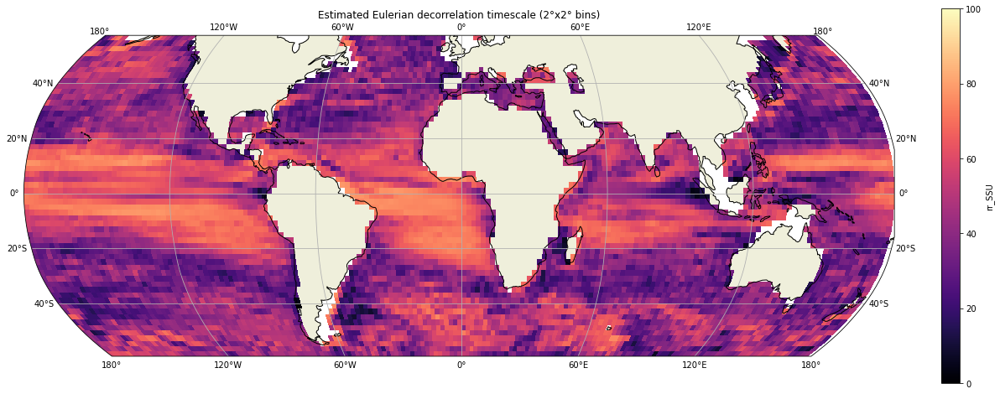

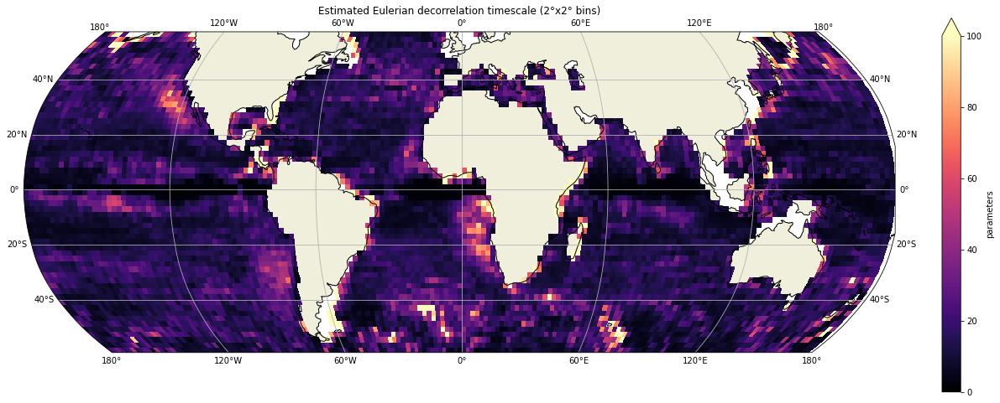

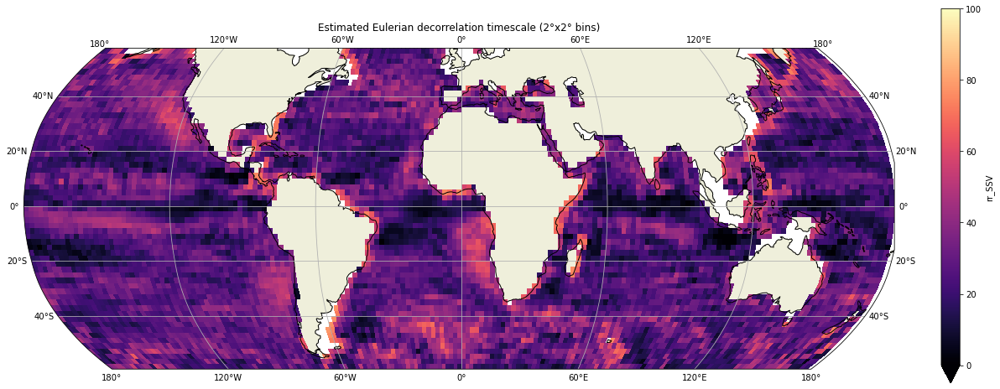

In [81]:
figsize = (20,20)
#SSU
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsE_low_out.sel(param = 'T').parameters,colmap='magma',vlim=(0,100))
ax.set_title('Estimated Eulerian decorrelation timescale (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(Te_integrate.rr_SSU,colmap='magma',vlim=(0,100))
ax.set_title('Estimated Eulerian decorrelation timescale (2°x2° bins)')


# SSV
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsE_low_out.sel(param = 'T').parameters,colmap='magma',vlim=(0,100))
ax.set_title('Estimated Eulerian decorrelation timescale (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(Te_integrate.rr_SSV,colmap='magma',vlim=(0,100))
ax.set_title('Estimated Eulerian decorrelation timescale (2°x2° bins)')

Text(0.5, 1.0, 'Estimated Lagrangian decorrelation timescale (2°x2° bins)')

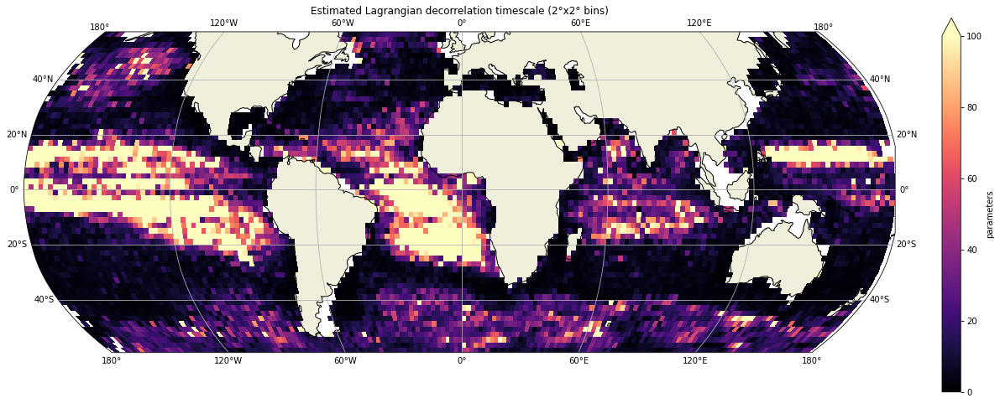

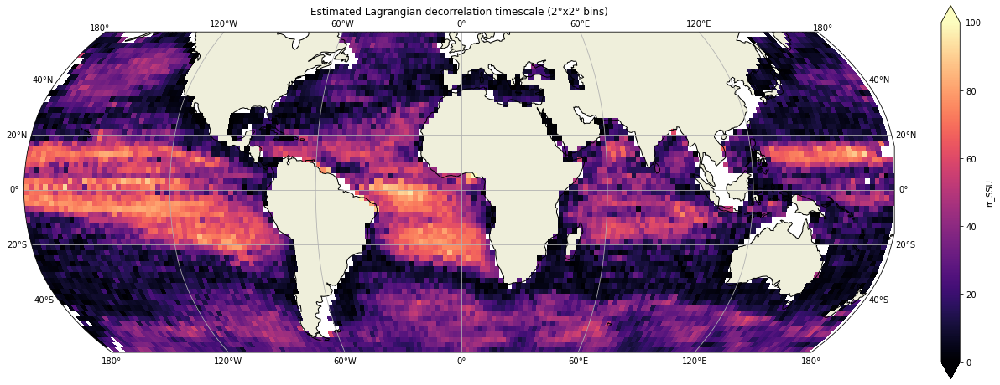

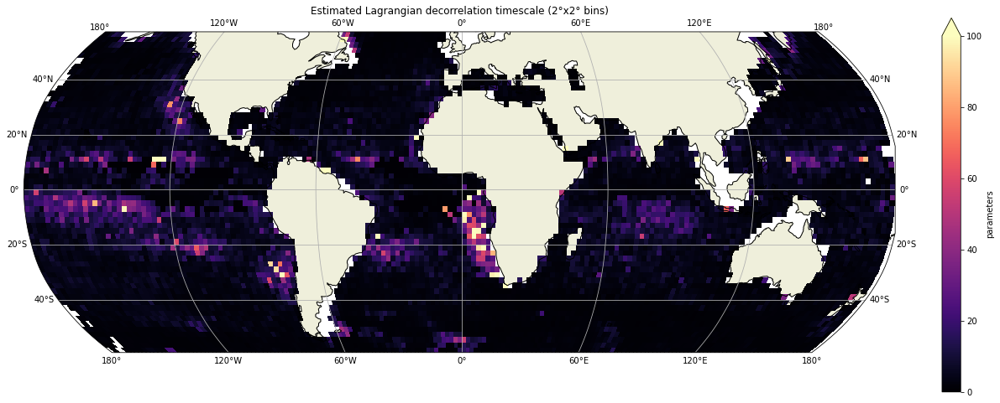

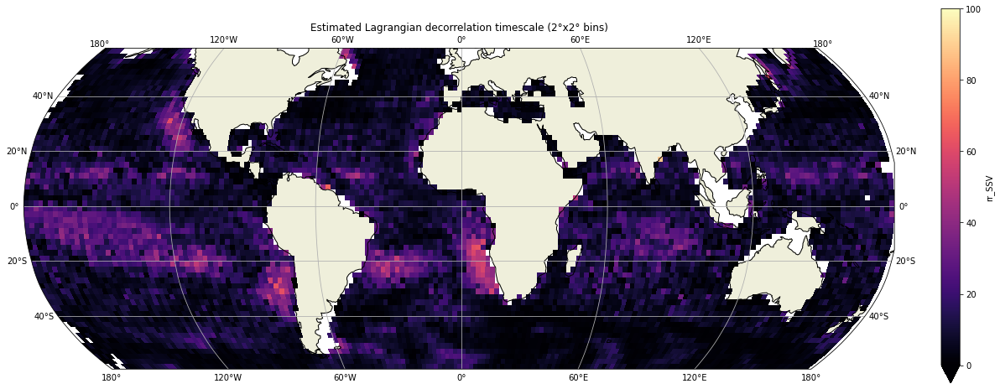

In [82]:
figsize = (20,20)
#SSU
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low_out.sel(param = 'T').parameters,colmap='magma',vlim=(0,100))
ax.set_title('Estimated Lagrangian decorrelation timescale (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(Tl_integrate.rr_SSU,colmap='magma',vlim=(0,100))
ax.set_title('Estimated Lagrangian decorrelation timescale (2°x2° bins)')

#SSV
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsL_low_out.sel(param = 'T').parameters,colmap='magma',vlim=(0,100))
ax.set_title('Estimated Lagrangian decorrelation timescale (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(Tl_integrate.rr_SSV,colmap='magma',vlim=(0,100))
ax.set_title('Estimated Lagrangian decorrelation timescale (2°x2° bins)')

Text(0.5, 1.0, 'Lagrangian/Eulerian decorrelation time scales ratio (2°x2° bins)')

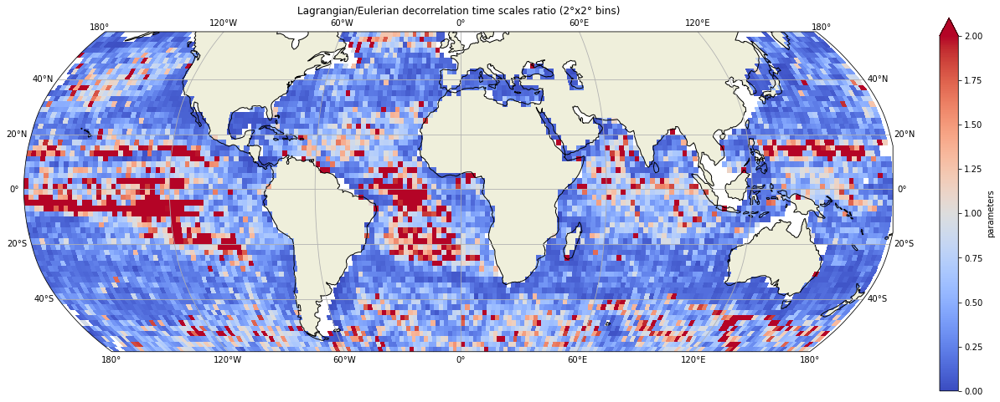

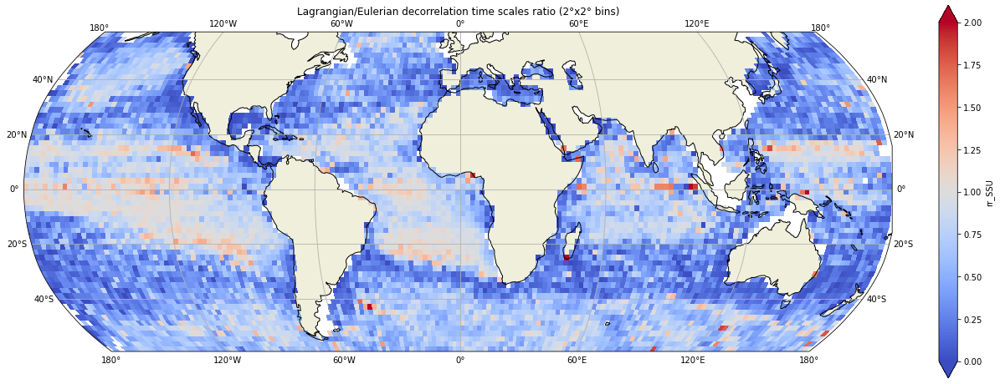

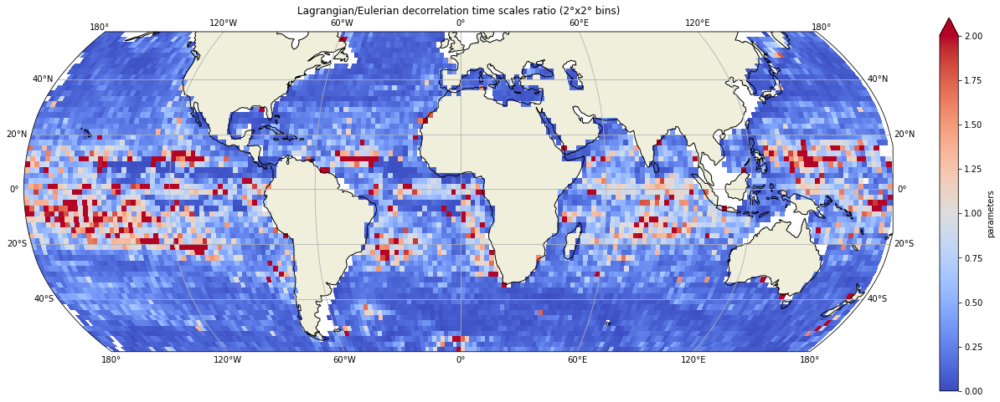

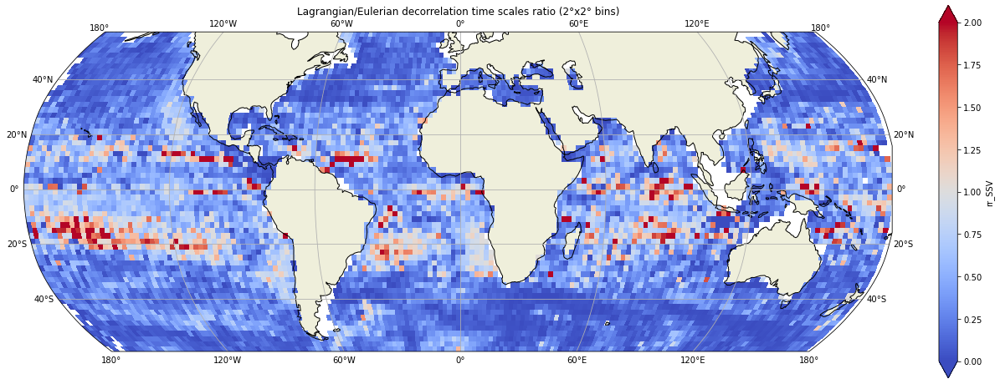

In [84]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low_out.sel(param='T').parameters/dsE_low_out.sel(param='T').parameters,colmap='coolwarm',vlim=(0,2))
ax.set_title('Lagrangian/Eulerian decorrelation time scales ratio (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(Tl_integrate.rr_SSU/Te_integrate.rr_SSU,colmap='coolwarm',vlim=(0,2))
ax.set_title('Lagrangian/Eulerian decorrelation time scales ratio (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsL_low_out.sel(param='T').parameters/_dsE_low_out.sel(param='T').parameters,colmap='coolwarm',vlim=(0,2))
ax.set_title('Lagrangian/Eulerian decorrelation time scales ratio (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(Tl_integrate.rr_SSV/Te_integrate.rr_SSV,colmap='coolwarm',vlim=(0,2))
ax.set_title('Lagrangian/Eulerian decorrelation time scales ratio (2°x2° bins)')

#### Estimates of k$ \bar V \bar T$

In [32]:
ds_low = xr.open_dataset(root_path+'energy_SSU_low_binned_dl2.0.nc')
ds_low_var = xr.open_dataset(root_path+'energy_SSU_low_variance_binned_dl2.0.nc')

In [33]:
k = 2*np.pi/100*1e-3
day2sec = 3600*24

In [34]:
Uebar = ds_low.E_energy_SSU
Ulbar = ds_low.L_energy_SSU

Uebar_bis = ds_low_var.E_energy_SSU
Ulbar_bis = ds_low_var.L_energy_SSU

Tbar = dsE_low_out.sel(param='T').parameters

Text(0.5, 1.0, 'k$\\overline{U}_L \\: \\overline{T}_E$ (2°x2° bins)')

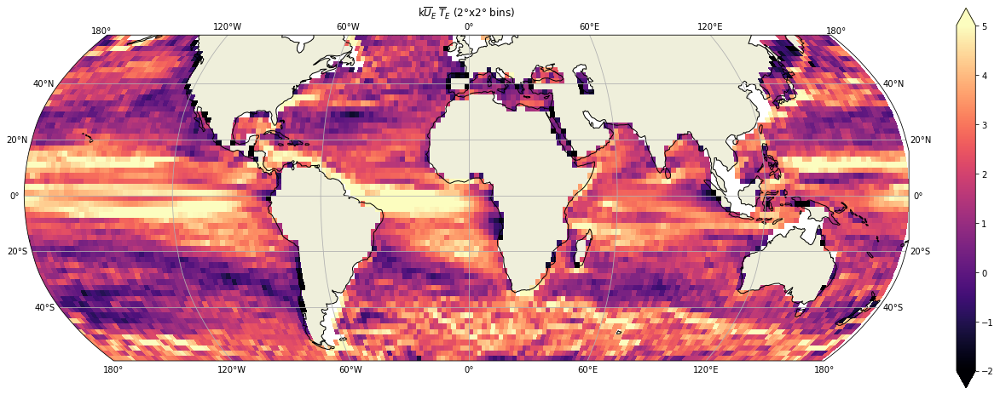

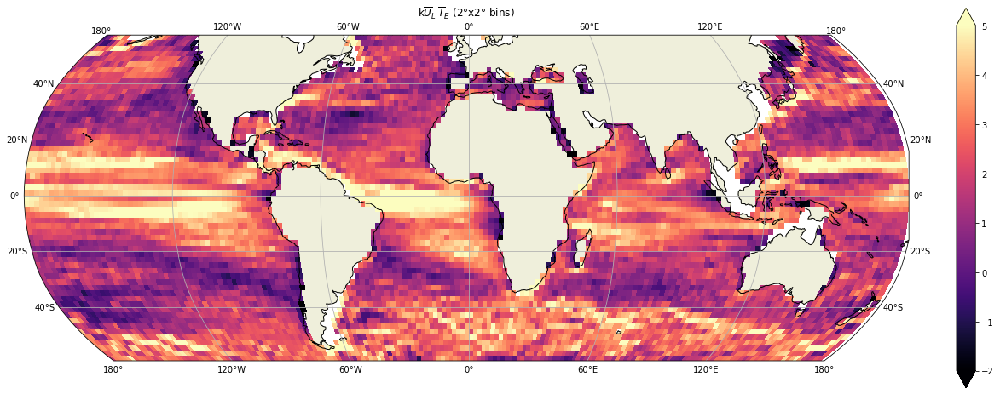

In [35]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log(k*Uebar*Tbar*day2sec),colmap='magma',vlim=(-2,5))
ax.set_title(r'k$\overline{U}_E \: \overline{T}_E$ (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log(k*Ulbar*Tbar*day2sec),colmap='magma',vlim=(-2,5))
ax.set_title(r'k$\overline{U}_L \: \overline{T}_E$ (2°x2° bins)')

Text(0.5, 1.0, 'k$\\overline{U}_L \\: \\overline{T}_E$ (2°x2° bins)')

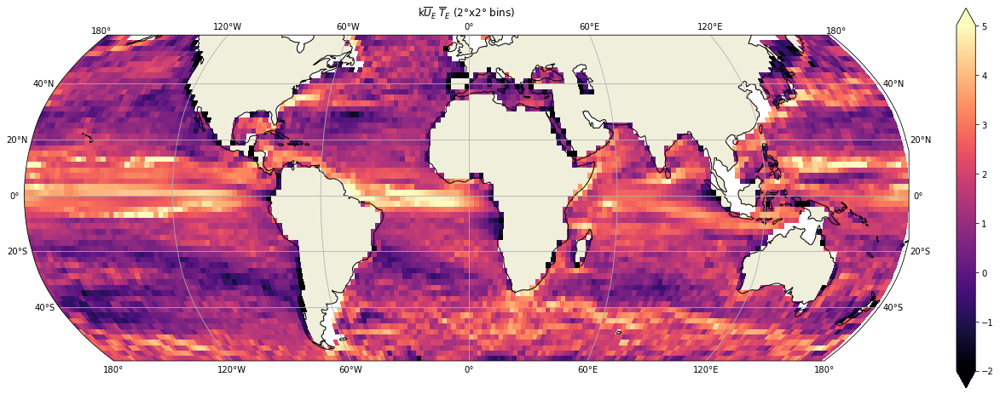

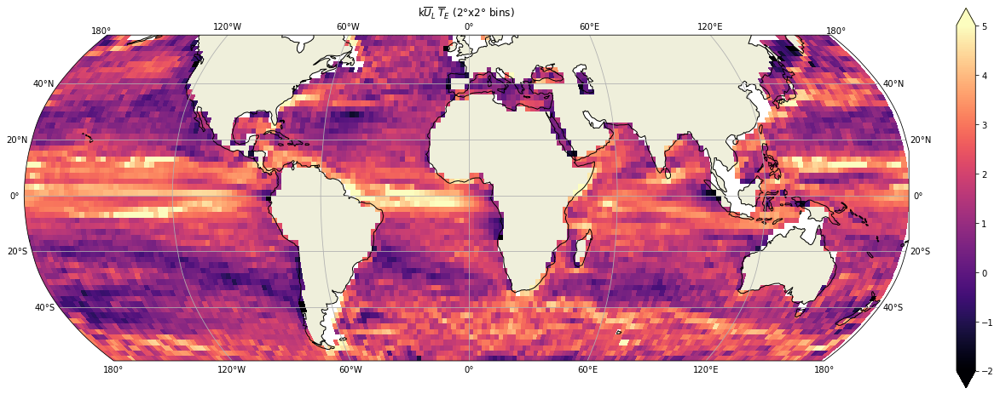

In [36]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log(k*Uebar_bis*Tbar*day2sec),colmap='magma',vlim=(-2,5))
ax.set_title(r'k$\overline{U}_E \: \overline{T}_E$ (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log(k*Ulbar_bis*Tbar*day2sec),colmap='magma',vlim=(-2,5))
ax.set_title(r'k$\overline{U}_L \: \overline{T}_E$ (2°x2° bins)')

Text(0.5, 1.0, 'k$\\overline{U}_L \\: \\overline{T}_E$ (2°x2° bins)')

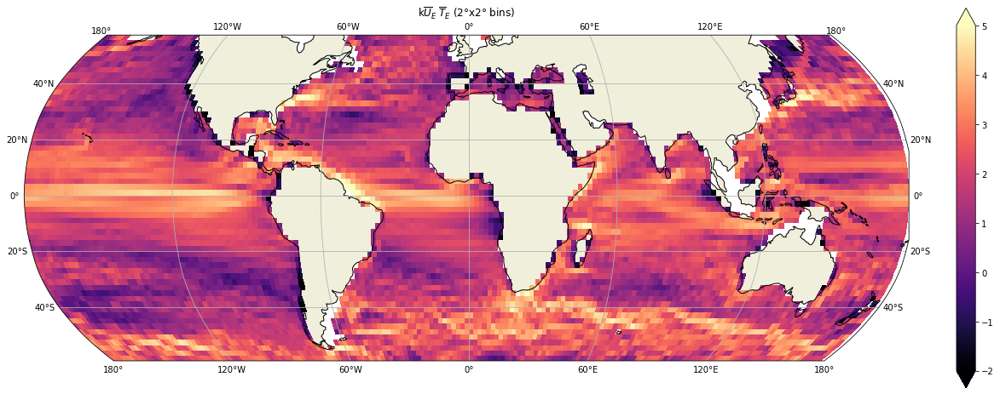

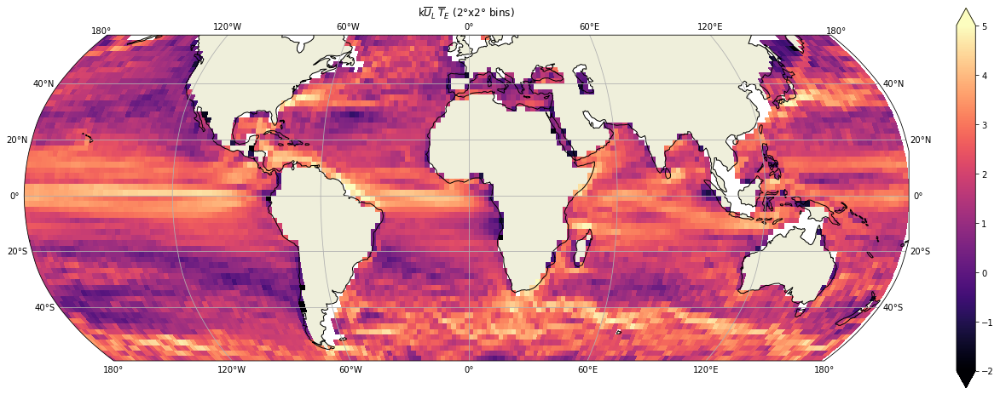

In [37]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log(k*Uebar*Te_integrate*day2sec),colmap='magma',vlim=(-2,5))
ax.set_title(r'k$\overline{U}_E \: \overline{T}_E$ (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log(k*Ulbar*Te_integrate*day2sec),colmap='magma',vlim=(-2,5))
ax.set_title(r'k$\overline{U}_L \: \overline{T}_E$ (2°x2° bins)')

Text(0.5, 1.0, 'k$\\overline{U}_L \\: \\overline{T}_E$ (2°x2° bins)')

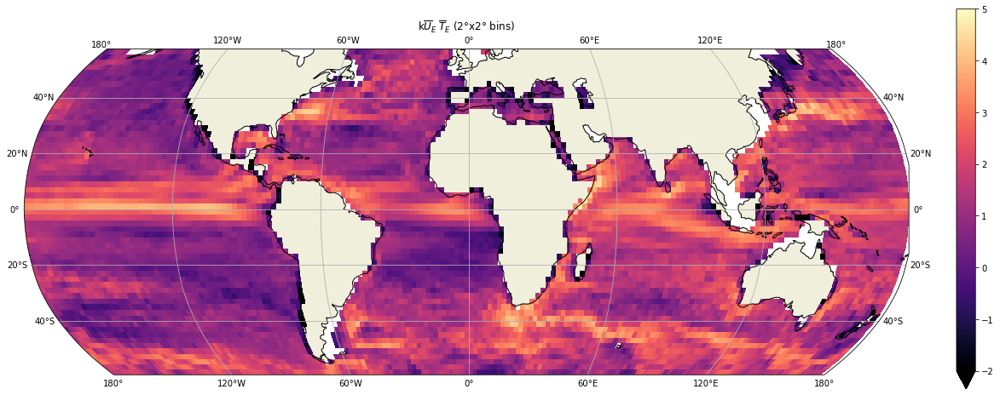

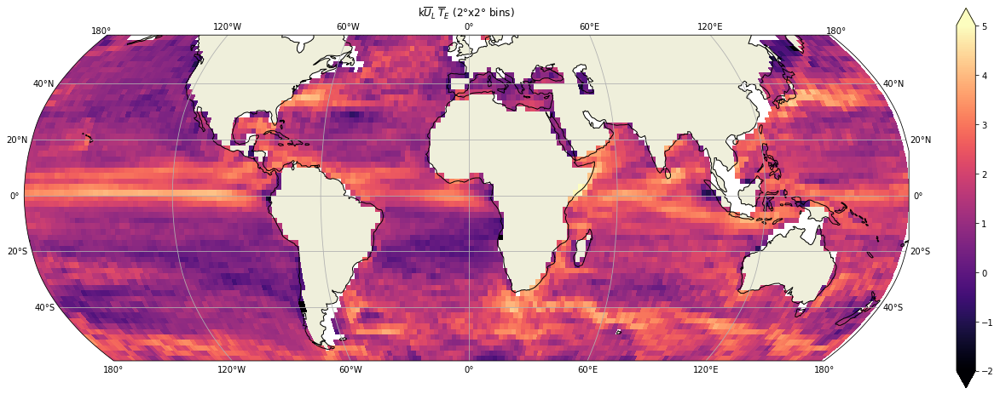

In [38]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log(k*Uebar_bis*Te_integrate*day2sec),colmap='magma',vlim=(-2,5))
ax.set_title(r'k$\overline{U}_E \: \overline{T}_E$ (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log(k*Ulbar_bis*Te_integrate*day2sec),colmap='magma',vlim=(-2,5))
ax.set_title(r'k$\overline{U}_L \: \overline{T}_E$ (2°x2° bins)')

In [39]:
k = 2*np.pi/300*1e-3

Text(0.5, 1.0, 'k$\\overline{U}_L \\: \\overline{T}_E$ (2°x2° bins)')

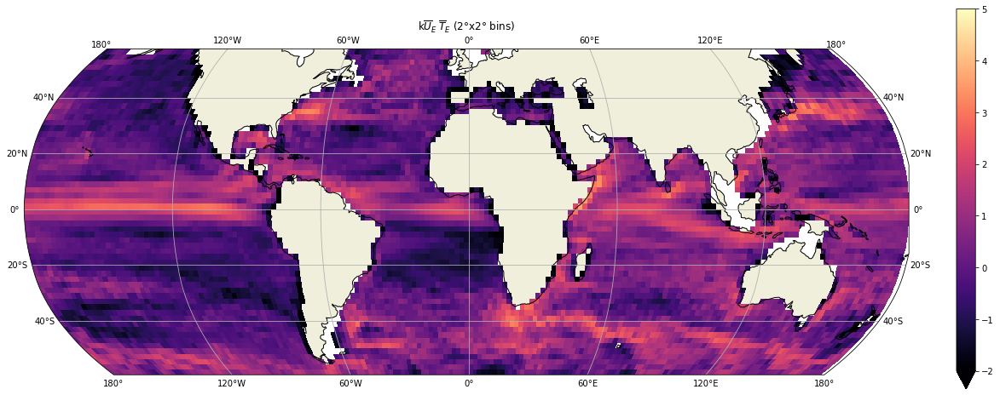

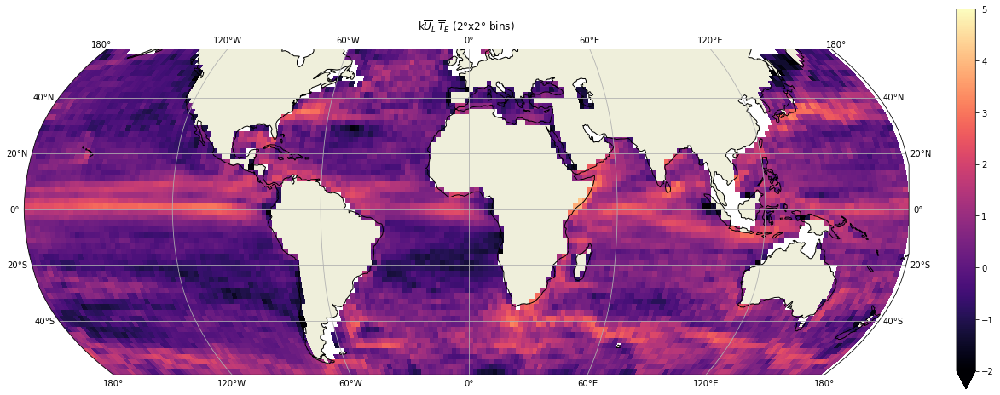

In [40]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log(k*Uebar_bis*Te_integrate*day2sec),colmap='magma',vlim=(-2,5))
ax.set_title(r'k$\overline{U}_E \: \overline{T}_E$ (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log(k*Ulbar_bis*Te_integrate*day2sec),colmap='magma',vlim=(-2,5))
ax.set_title(r'k$\overline{U}_L \: \overline{T}_E$ (2°x2° bins)')

In [41]:
k = xr.open_dataset(root_path+'k_estimate.nc').rename({'lon_bins':'lon_bin','lat_bins':'lat_bin'})

In [42]:
k = k.k#*Uebar_bis*Te_integrate*day2sec

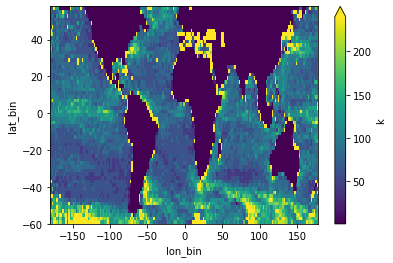

In [43]:
(2*np.pi*1e-3/k).plot(y='lat_bin',vmax=240)

In [44]:
k

<xarray.DataArray 'k' (lon_bin: 179, lat_bin: 59)>
array([[3.471373e-05, 5.192715e-05, 3.471373e-05, ..., 1.030030e-04,
        7.757019e-05, 1.030030e-04],
       [4.456160e-05, 3.902600e-05, 3.125963e-05, ..., 6.220976e-05,
        1.030030e-04, 7.757019e-05],
       [6.404878e-06, 2.843070e-05, 3.471373e-05, ..., 1.030030e-04,
        1.030030e-04, 6.404878e-06],
       ...,
       [4.456160e-05, 3.902600e-05, 2.607131e-05, ..., 7.757019e-05,
        1.030030e-04, 7.757019e-05],
       [4.456160e-05, 3.471373e-05, 3.902600e-05, ..., 7.757019e-05,
        1.030030e-04, 3.471373e-05],
       [4.456160e-05, 3.902600e-05, 3.902600e-05, ..., 1.030030e-04,
        7.757019e-05, 6.220976e-05]])
Coordinates:
    T        (lon_bin, lat_bin) float64 ...
    Ubar     (lon_bin, lat_bin) float64 ...
    Tbar     (lon_bin, lat_bin) float64 ...
  * lon_bin  (lon_bin) float64 -179.0 -177.0 -175.0 -173.0 ... 173.0 175.0 177.0
  * lat_bin  (lat_bin) float64 -59.0 -57.0 -55.0 -53.0 ... 51.0 53.0 55.0 57.0

In [45]:
k = k.where(2*np.pi/k*1e-3>1)

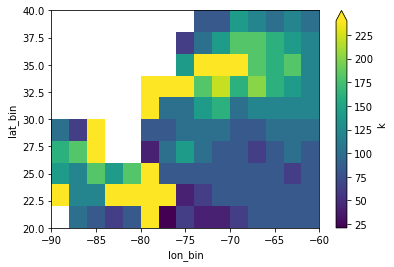

In [46]:
(2*np.pi*1e-3/k).where((k.lon_bin<-60) & (k.lon_bin>-90) & (k.lat_bin<40) & (k.lat_bin>20),drop=True).plot(y='lat_bin',vmax=240)

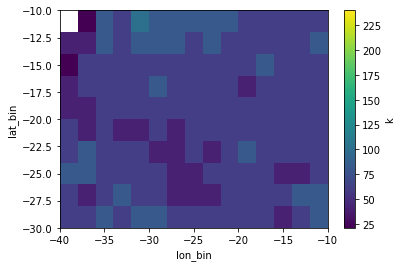

In [47]:
(2*np.pi*1e-3/k).where((k.lon_bin<-10) & (k.lon_bin>-40) & (k.lat_bin<-10) & (k.lat_bin>-30),drop=True).plot(y='lat_bin',vmax=240)

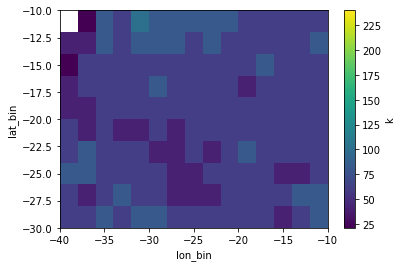

In [48]:
(2*np.pi*1e-3/k).where((k.lon_bin<-10) & (k.lon_bin>-40) & (k.lat_bin<-10) & (k.lat_bin>-30),drop=True).plot(y='lat_bin',vmax=240)

Text(0.5, 1.0, 'k$\\overline{U}_L \\: \\overline{T}_E$ (2°x2° bins)')

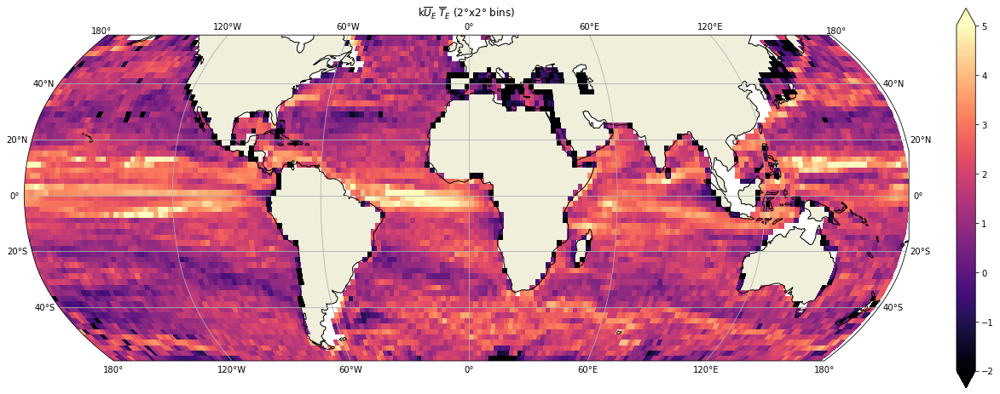

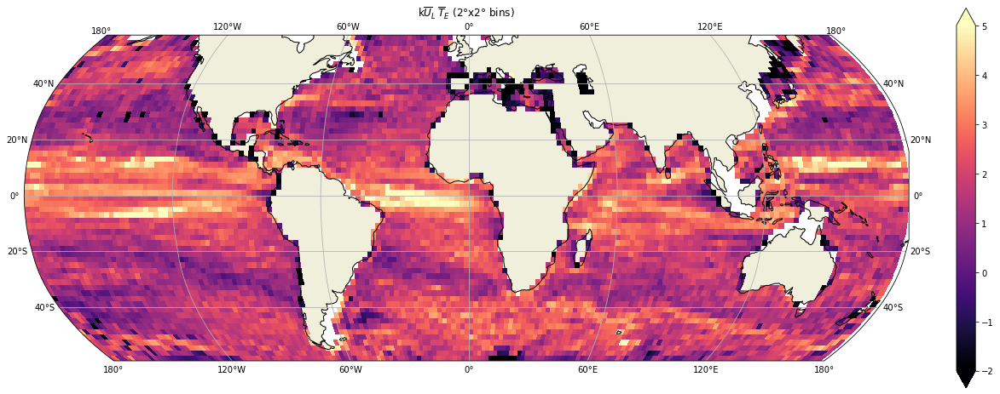

In [49]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log(k*Uebar_bis*Tbar*day2sec),colmap='magma',vlim=(-2,5))
ax.set_title(r'k$\overline{U}_E \: \overline{T}_E$ (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log(k*Ulbar_bis*Tbar*day2sec),colmap='magma',vlim=(-2,5))
ax.set_title(r'k$\overline{U}_L \: \overline{T}_E$ (2°x2° bins)')

/opt/anaconda3/envs/croco/lib/python3.8/site-packages/xarray/core/computation.py:727: RuntimeWarning: invalid value encountered in log
  result_data = func(*input_data)


Text(0.5, 1.0, 'k$\\overline{U}_L \\: \\overline{T}_E$ (2°x2° bins)')

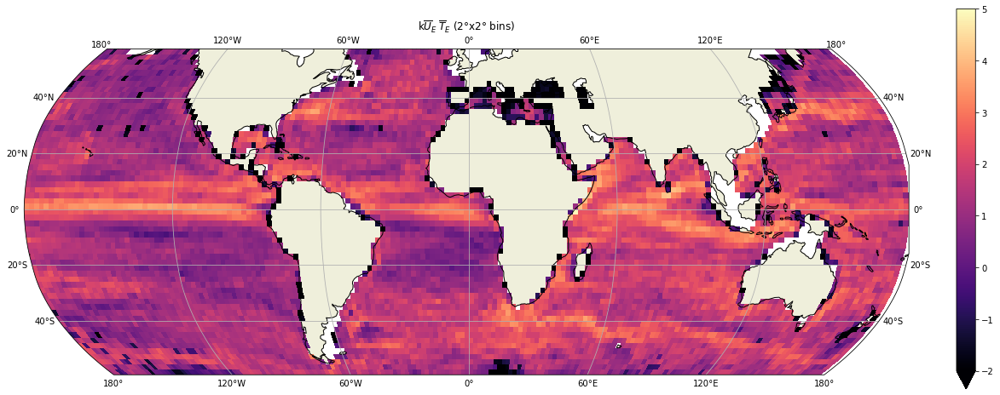

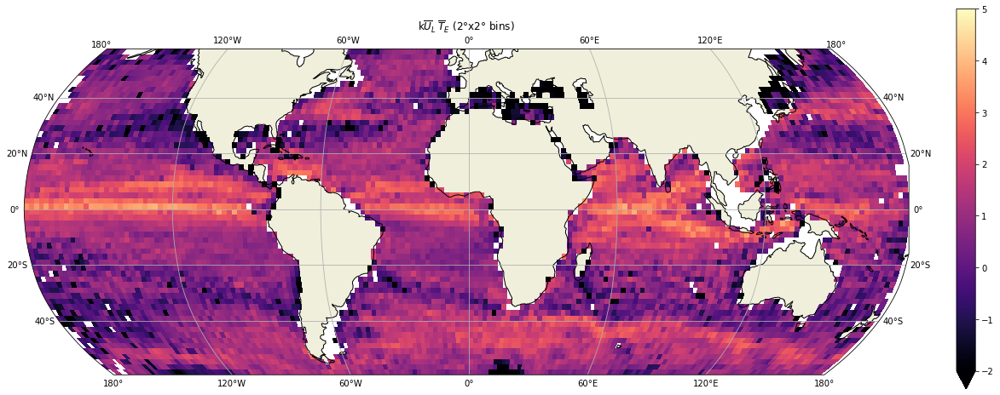

In [52]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log(k*Uebar_bis*Te_integrate*day2sec),colmap='magma',vlim=(-2,5))
ax.set_title(r'k$\overline{U}_E \: \overline{T}_E$ (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log(k*Ulbar_bis*Tl_integrate*day2sec),colmap='magma',vlim=(-2,5))
ax.set_title(r'k$\overline{U}_L \: \overline{T}_E$ (2°x2° bins)')

Text(0.5, 1.0, 'k$\\overline{U}_L \\: \\overline{T}_E$ (2°x2° bins)')

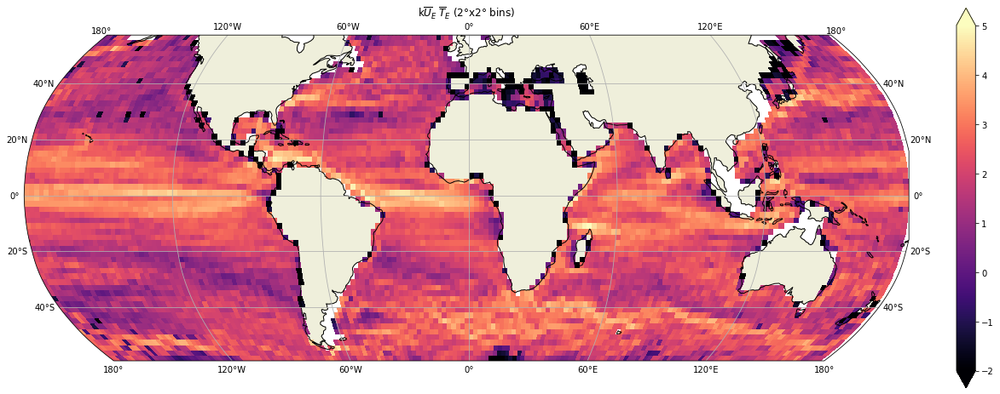

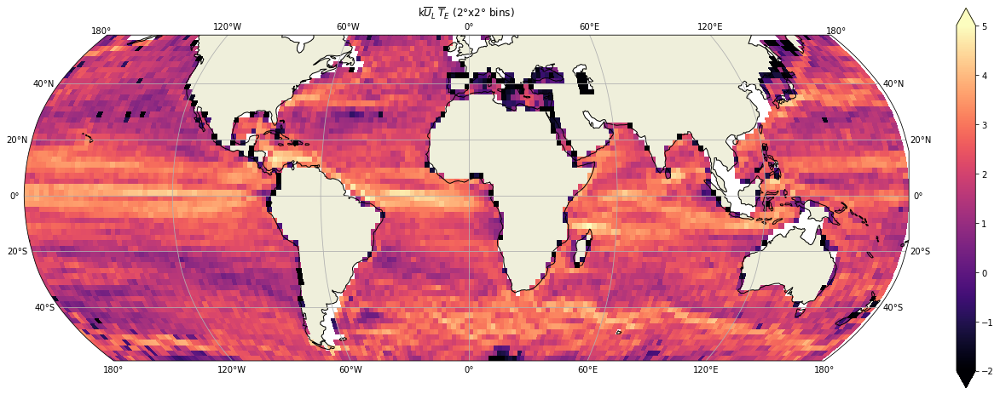

In [51]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log(k*Uebar*Te_integrate*day2sec),colmap='magma',vlim=(-2,5))
ax.set_title(r'k$\overline{U}_E \: \overline{T}_E$ (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log(k*Ulbar*Te_integrate*day2sec),colmap='magma',vlim=(-2,5))
ax.set_title(r'k$\overline{U}_L \: \overline{T}_E$ (2°x2° bins)')

In [85]:
cluster.close()

distributed.client - ERROR - Failed to reconnect to scheduler after 30.00 seconds, closing client
